compared to the last version, this version added the imaging quality precheck of each trial, and active neuron selection no longer only select the sensory related neurons but also motor related neurons.

The threshold is:

* if the neuron is either a sensory related neuron or a motor related neuron, it would be selected as active neuron
    * sensory related neuron: the neuron is responsive to at least one kind of stimulus out of 3 stimulus(30% of trials coeff>0.35 and R2>0.36)
    * motor related neuron: the neuron is related to at least one kind of behavior(PC or freezing), if one kind of behavior have less than 4 trials, then if the neuron is a active neuron is it is responsive in at least one trial, or it need to be responsvie in more than 30% of trials.

In [1]:
from attention_project_utils import * 
import numpy as np
import pandas as pd
import os
import tifffile
import glob
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
import matplotlib.lines as mlines
import scipy.cluster.hierarchy as sch
import seaborn as sns


import sklearn
from sklearn import linear_model
from sklearn.metrics import r2_score 


In [2]:
def gen_regressor(x, tau, fps=3, record_trail=1):
    duration = int(length/(fps*record_trail)) *  (record_trail)
    print(length)
    t = np.arange(0, duration, duration/len(x))
    print(t.shape)
    if tau == 0:
        return x
    zeros = np.zeros_like(t)
    print(zeros.shape)
    padded = np.concatenate([zeros,x,zeros])
#     plt.plot(padded)
#     plt.show()
    kernel = np.concatenate([zeros, np.exp(-t / tau )])
    print( np.exp(-t / tau ))
#     plt.plot(kernel)
#     plt.show()
    convolved = np.convolve(padded, kernel, mode='same')[len(t):-len(t)]    
    if convolved.mean() == 0:
        return convolved
    return convolved / convolved.mean()

def get_regression(df0f):
    listregintercept=[]
    listregcoeff=[]
    listr2=[] 
    
#     regressors = {'Dot': a, 'OKR': b, 'Loom': c}
    regressors = {'Dot': a}
#     print(regressors)
    X = pd.DataFrame(regressors,columns=['Dot']) 
#     print(X)
   
    for i in range(0,len(df0f)):
        df = pd.DataFrame (df0f[i])     
        regr = linear_model.LinearRegression()           
        x = regr.fit(X,df)
        listregcoeff.append(regr.coef_[0][0])  
        listregintercept.append(x.intercept_[0])
        r2 = r2_score(df, x.predict(X), multioutput='raw_values')
        listr2.append(r2[0])  
    
    return listregintercept,listregcoeff,listr2

(39,)
39
(39,)
(39,)
[1.00000000e+00 8.21947766e-01 6.75598129e-01 5.55306373e-01
 4.56432833e-01 3.75163947e-01 3.08365168e-01 2.53460061e-01
 2.08330931e-01 1.71237143e-01 1.40747987e-01 1.15687493e-01
 9.50890768e-02 7.81582542e-02 6.42420024e-02 5.28035703e-02
 4.34017767e-02 3.56739933e-02 2.93221591e-02 2.41012832e-02
 1.98099959e-02 1.62827818e-02 1.33835961e-02 1.10006169e-02
 9.04193252e-03 7.43199623e-03 6.10871270e-03 5.02104275e-03
 4.12703487e-03 3.39220709e-03 2.78821704e-03 2.29176877e-03
 1.88371422e-03 1.54831469e-03 1.27263380e-03 1.04603851e-03
 8.59789016e-04 7.06701660e-04 5.80871851e-04]


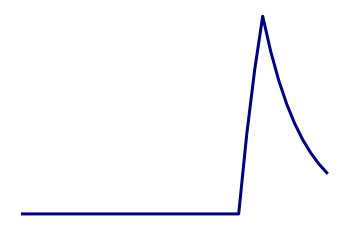

In [3]:
list_calciumtraces = list(np.ones(39))
# length =len(list_calciumtraces[0])
length =len(list_calciumtraces)
# listprey,listokr,listloom = get_carbox(length)
listprey = np.concatenate([np.zeros(27),np.ones(3),np.zeros(9)])
# listokr = list(range(300,400))
# listloom = list(range(1700,1800))
print(listprey.shape)

a= gen_regressor(listprey,1.7)
a = (a-min(a))/(max(a)-min(a))
# a = np.concatenate([np.zeros(92),a,a,a,a,a,a])
# b= gen_regressor(listokr,2.6)
# b = (b-min(b))/(max(b)-min(b))

# c= gen_regressor(listloom,2.6)
# c = (c-min(c))/(max(c)-min(c))

# plt.axis('off')
plt.plot(a,color='navy',linewidth = 3)
plt.axis('off')
plt.show()

In [4]:
#### main_dir_list = ["D:\\LCr_UV_HSA_Luminance_4\\20230102"]+["D:\\LCr_UV_HSA_Luminance_5\\20230109"]*2
# fish_index_list =['F2_16_00','F3_20_30','F4_22_30']

# main_dir_list = ["F:\\LCr_UV_HSA_Lum_Low_1\\20230312"]*5+["F:\\LCr_UV_HSA_Lum_Low_2\\20230409"]*3+["F:\\LCr_UV_HSA_Lum_Low_2\\20230410"]*4
# fish_index_list = ['F1_10_40','F2_12_20','F4_16_00','F5_18_00','F6_20_00','F2_13_00','F4_17_00','F5_19_00','F1_11_00','F2_13_00','F4_16_00','F6_19_30']

main_dir_list = ["F:\\LCr_UV_HSA_Lum_Low_1\\20230312"]*5+["F:\\LCr_UV_HSA_Lum_Low_2\\20230409"]*3+["F:\\LCr_UV_HSA_Lum_Low_2\\20230410"]*2
fish_index_list = ['F1_10_40','F2_12_20','F4_16_00','F5_18_00','F6_20_00','F2_13_00','F4_17_00','F5_19_00','F2_13_00','F4_16_00']

visuomotor_list = ['ns','Prey','Freezing','Luminance','motor_Freezing','motor_PC']

time_len = 39
plane_no = 9

output_dir = 'C:\\Users\\yxton\\Documents\\Code\\2p\\freezing_project\\clustering_files_low_elevation'
create_directory(output_dir)

# df_VMV_all = pd.DataFrame(columns = ['ns','Prey','Freezing','Luminance','only_PC','only_Bradycardia','ROI_id','Date','Fish','Plane'])

False

In [9]:
list_df_VMV = []
for main_dir,fish in zip(main_dir_list,fish_index_list):
    date_no = main_dir.split('\\')[-1]
    
    # read bradyinfo and vsinfo
    vsinfo = pd.read_excel(main_dir+'\\behavior\\'+fish+'//vsinfo_'+date_no+'_'+fish+'.xlsx')
    
    if main_dir == "F:\\LCr_UV_HSA_Lum_Low_1\\20230312":
        bradyinfo_dir = glob.glob(main_dir+'\\bradyinfo\\Bradyinfo*'+fish+'.xlsx')[0]
    else:
        bradyinfo_dir = glob.glob(main_dir+'\\behavior\\'+fish+'\\Bradyinfo*'+fish+'.xlsx')[0]
                                  
    Brady_info = pd.read_excel(bradyinfo_dir,sheet_name = 'Bradyinfo')
    trial_no = vsinfo.shape[0]
    
    
    pixel_no_total = eval(Brady_info['roi'][0])[2]*eval(Brady_info['roi'][0])[3]
    Bad_Imaging_Quality_list = list(np.argsort(Brady_info['Good_Pixel_Number'])[:2])+list(np.where(Brady_info['Good_Pixel_Number']/pixel_no_total<0.2)[0])
    print(Bad_Imaging_Quality_list)
    #     Brady_info['Good_Pixel_Number']
    
    # extract the moving dot trial index used for picking out the active neurons
#     stim_trial_idx = [i+1 for i in np.where(vsinfo.Left_Stimulus_Type=='m')[0]]+[i+1 for i in np.where(vsinfo.Right_Stimulus_Type=='m')[0]]+[i+1 for i in np.where(vsinfo.Right_Stimulus_Type=='lum')[0]]
    
    
    # every VMV's trial index of this fish
    for ii in range(0,len(visuomotor_list)):
        locals()['Index_'+str(visuomotor_list[ii])] = []
    for t in range(0,trial_no):
        if Bad_Imaging_Quality_list.count(t) == 0:
            if vsinfo.Left_Stimulus_Type[t] == 'n' and vsinfo.Right_Stimulus_Type[t] == 'n':
                Index_ns.append(t+1)
            else:
                if Brady_info['Behavior_Classification'][t] == 'Freezing':
                    Index_motor_Freezing.append(t+1)
                if Brady_info['Bradycardia_Classification'][t] == 0 and Brady_info['PC_trial'][t] == True:
                    Index_motor_PC.append(t+1)
                if vsinfo.Left_Stimulus_Type[t] == 'm' or vsinfo.Right_Stimulus_Type[t] == 'm':
                    if vsinfo.Left_Stimulus_Size[t] + vsinfo.Right_Stimulus_Size[t] == 20:
                        Index_Freezing.append(t+1)
                    if vsinfo.Left_Stimulus_Size[t] + vsinfo.Right_Stimulus_Size[t] == 4:
                        Index_Prey.append(t+1)
                if vsinfo.Left_Stimulus_Type[t] == 'lum' or vsinfo.Right_Stimulus_Type[t] == 'lum':
                    Index_Luminance.append(t+1)
    
    
    for plane_i in range(1,plane_no+1):
        for t in range(1,trial_no+1):
            locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(t)+'_dir'] = main_dir+'\\processed\\'+fish+'\\processed_suite2p\\plane'+str(plane_i)+'\\DeltaF_F\\'+fish+'_Trial'+str(t)+".csv"
            print(locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(t)+'_dir'])
            locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(t)] = pd.read_csv(locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(t)+'_dir'])


        # roi number
        locals()['roi_num_'+date_no+str(fish)+'_p'+str(plane_i)] = locals()['df_'+date_no+'_'+str(fish)+'_p'+str(plane_i)+'_trial_1'].shape[0]
        print(date_no + str(fish)+' plane'+str(plane_i)+' roi number is ' + str(locals()['roi_num_'+date_no+str(fish)+'_p'+str(plane_i)]))

        locals()['active_roi_idx_'+date_no+str(fish)+'_p'+str(plane_i)] = list()
        for roi_i in range(0,locals()['roi_num_'+date_no+str(fish)+'_p'+str(plane_i)]):
            for temp_stim in visuomotor_list[1:]:     
                stim_trial_idx = locals()['Index_'+temp_stim]
                temp_activity = np.zeros([len(stim_trial_idx),time_len])
                temp_activity_normed = np.zeros([len(stim_trial_idx),time_len])
                temp_active_no = 0
                for j in range(0,len(stim_trial_idx)):
                    temp_activity[j] = locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(stim_trial_idx[j])].iloc[roi_i,range(0,time_len)].values
                    if np.max(temp_activity[j])>0.4:
                        temp_activity_normed[j] = (temp_activity[j]-min(temp_activity[j]))/(max(temp_activity[j])-min(temp_activity[j]))
                listregintercept,listregcoeff,listr2 = get_regression(temp_activity_normed)
                for temp_i in range(0,len(listr2)):
                    if  listregcoeff[temp_i] > 0.35 and listr2[temp_i]>0.36:
#                         plt.plot(temp_activity_normed[temp_i])
#                         plt.fill_between(np.arange(27,30),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
#                         plt.show()
#                         print('roi no. is '+str(roi_i))
#                         print('coeffcient is '+str(listregcoeff[temp_i]))
#                         print('R2 is '+str(listr2[temp_i]))
                        temp_active_no = temp_active_no+1
        #         print(temp_active_no)
                if temp_active_no/len(stim_trial_idx)>0.3:
                    locals()['active_roi_idx_'+date_no+str(fish)+'_p'+str(plane_i)].append(roi_i)
#                     for temp_i in range(0,len(listr2)):
#                         if  listregcoeff[temp_i] > 0.4 and listr2[temp_i]>0.36:
#                             plt.plot(temp_activity_normed[temp_i])
#                             plt.fill_between(np.arange(27,30),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
#                             plt.show()
#                             print('roi no. is '+str(roi_i))
#                             print('coeffcient is '+str(listregcoeff[temp_i]))
#                             print('R2 is '+str(listr2[temp_i]))
                    
                    break
#                 for temp_i in range(0,len(listr2)):
#                     if  listregcoeff[temp_i] > 0.5 and listr2[temp_i]>0.5:
#                         plt.plot(temp_activity_normed[temp_i])
#                         plt.show()
#                         print('roi no. is '+str(roi_i))
#                         print('coeffcient is '+str(listregcoeff[temp_i]))
#                         print('R2 is '+str(listr2[temp_i]))
        for t in range(1,trial_no+1):
            locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(t)] = locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(t)].iloc[locals()['active_roi_idx_'+date_no+str(fish)+'_p'+str(plane_i)],:]

         # active roi number
        locals()['active_roi_num_'+date_no+str(fish)+'_p'+str(plane_i)] = locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(t)].shape[0]
        print(date_no + str(fish)+' plane'+str(plane_i)+' active roi number is ' + str(locals()['active_roi_num_'+date_no+str(fish)+'_p'+str(plane_i)])) 

        
        temp_df_VMV =  pd.DataFrame(columns = ['ns','Prey','Freezing','Luminance','motor_Freezing','motor_PC','ROI_id','Date','Fish','Plane'])
        # computed every VMV score
        for VMV in visuomotor_list:
            index_temp = locals()['Index_'+VMV]
            temp_averaged_score = np.zeros(locals()['active_roi_num_'+date_no+str(fish)+'_p'+str(plane_i)])
            for t in index_temp:
                temp_activity = np.zeros([locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_1'].shape[0],time_len])
                temp_activity_normed = np.zeros([locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_1'].shape[0],time_len])
                for j in range(0,locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_1'].shape[0]):
                    temp_activity[j] = locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(t)].iloc[j,range(0,time_len)].values
                    temp_activity_normed[j] = (temp_activity[j]-min(temp_activity[j]))/(max(temp_activity[j])-min(temp_activity[j]))
                listregintercept,listregcoeff,listr2 = get_regression(temp_activity_normed)
                score_t = np.array(listregcoeff) * np.array(listr2)
                temp_averaged_score = np.add(temp_averaged_score,score_t/len(index_temp))
            temp_df_VMV[VMV] = temp_averaged_score
        temp_df_VMV.ROI_id = locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_1'].ROI_id.values
        temp_df_VMV.Date = date_no
        temp_df_VMV.Fish = fish
        temp_df_VMV.Plane = plane_i
        
        list_df_VMV.append(temp_df_VMV)
        
# df_VMV_all = pd.concat(list_df_VMV)
# df_VMV_all.index = range(0,df_VMV_all.shape[0])

[42, 13, 42]
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane1\DeltaF_F\F1_10_40_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane1\DeltaF_F\F1_10_40_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane1\DeltaF_F\F1_10_40_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane1\DeltaF_F\F1_10_40_Trial4.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane1\DeltaF_F\F1_10_40_Trial5.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane1\DeltaF_F\F1_10_40_Trial6.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane1\DeltaF_F\F1_10_40_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane1\DeltaF_F\F1_10_40_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane1\DeltaF_F\F1_10_40_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane2\DeltaF_F\F1_10_40_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane2\DeltaF_F\F1_10_40_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane2\DeltaF_F\F1_10_40_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane2\DeltaF_F\F1_10_40_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane2\DeltaF_F\F1_10_40_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane2\DeltaF_F\F1_10_40_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane2\DeltaF_F\F1_10_40_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane2\DeltaF_F\F1_10_40_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane2\DeltaF_F\F1_10_40_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane4\DeltaF_F\F1_10_40_Trial16.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane4\DeltaF_F\F1_10_40_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane4\DeltaF_F\F1_10_40_Trial18.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane4\DeltaF_F\F1_10_40_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane4\DeltaF_F\F1_10_40_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane4\DeltaF_F\F1_10_40_Trial21.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane4\DeltaF_F\F1_10_40_Trial22.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane4\DeltaF_F\F1_10_40_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane4\DeltaF_F\F1_10_40_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane5\DeltaF_F\F1_10_40_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane5\DeltaF_F\F1_10_40_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane5\DeltaF_F\F1_10_40_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane5\DeltaF_F\F1_10_40_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane5\DeltaF_F\F1_10_40_Trial48.csv
20230312F1_10_40 plane5 roi number is 1515
20230312F1_10_40 plane5 active roi number is 207
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane6\DeltaF_F\F1_10_40_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane6\DeltaF_F\F1_10_40_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane6\DeltaF_F\F1_10_40_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\pro

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane7\DeltaF_F\F1_10_40_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane7\DeltaF_F\F1_10_40_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane7\DeltaF_F\F1_10_40_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane7\DeltaF_F\F1_10_40_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane7\DeltaF_F\F1_10_40_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane7\DeltaF_F\F1_10_40_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane7\DeltaF_F\F1_10_40_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane7\DeltaF_F\F1_10_40_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane7\DeltaF_F\F1_10_40_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane9\DeltaF_F\F1_10_40_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane9\DeltaF_F\F1_10_40_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane9\DeltaF_F\F1_10_40_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane9\DeltaF_F\F1_10_40_Trial10.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane9\DeltaF_F\F1_10_40_Trial11.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane9\DeltaF_F\F1_10_40_Trial12.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane9\DeltaF_F\F1_10_40_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane9\DeltaF_F\F1_10_40_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F1_10_40\processed_suite2p\plane9\DeltaF_F\F1_10_40_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\process

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane1\DeltaF_F\F2_12_20_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane1\DeltaF_F\F2_12_20_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane1\DeltaF_F\F2_12_20_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane1\DeltaF_F\F2_12_20_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane1\DeltaF_F\F2_12_20_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane1\DeltaF_F\F2_12_20_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane1\DeltaF_F\F2_12_20_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane1\DeltaF_F\F2_12_20_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane1\DeltaF_F\F2_12_20_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane3\DeltaF_F\F2_12_20_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane3\DeltaF_F\F2_12_20_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane3\DeltaF_F\F2_12_20_Trial21.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane3\DeltaF_F\F2_12_20_Trial22.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane3\DeltaF_F\F2_12_20_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane3\DeltaF_F\F2_12_20_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane3\DeltaF_F\F2_12_20_Trial25.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane3\DeltaF_F\F2_12_20_Trial26.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane3\DeltaF_F\F2_12_20_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane4\DeltaF_F\F2_12_20_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane4\DeltaF_F\F2_12_20_Trial48.csv
20230312F2_12_20 plane4 roi number is 1828
20230312F2_12_20 plane4 active roi number is 262
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane5\DeltaF_F\F2_12_20_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane5\DeltaF_F\F2_12_20_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane5\DeltaF_F\F2_12_20_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane5\DeltaF_F\F2_12_20_Trial4.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane5\DeltaF_F\F2_12_20_Trial5.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane5\DeltaF_F\F2_12_20_Trial6.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\proces

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane6\DeltaF_F\F2_12_20_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane6\DeltaF_F\F2_12_20_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane6\DeltaF_F\F2_12_20_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane6\DeltaF_F\F2_12_20_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane6\DeltaF_F\F2_12_20_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane6\DeltaF_F\F2_12_20_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane6\DeltaF_F\F2_12_20_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane6\DeltaF_F\F2_12_20_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane6\DeltaF_F\F2_12_20_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane8\DeltaF_F\F2_12_20_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane8\DeltaF_F\F2_12_20_Trial10.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane8\DeltaF_F\F2_12_20_Trial11.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane8\DeltaF_F\F2_12_20_Trial12.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane8\DeltaF_F\F2_12_20_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane8\DeltaF_F\F2_12_20_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane8\DeltaF_F\F2_12_20_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane8\DeltaF_F\F2_12_20_Trial16.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane8\DeltaF_F\F2_12_20_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proce

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane9\DeltaF_F\F2_12_20_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane9\DeltaF_F\F2_12_20_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane9\DeltaF_F\F2_12_20_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane9\DeltaF_F\F2_12_20_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane9\DeltaF_F\F2_12_20_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane9\DeltaF_F\F2_12_20_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane9\DeltaF_F\F2_12_20_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane9\DeltaF_F\F2_12_20_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F2_12_20\processed_suite2p\plane9\DeltaF_F\F2_12_20_Trial48.csv
20230312F2_12_20 plane9 roi number is

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial22.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial25.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial26.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane4\DeltaF_F\F4_16_00_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane4\DeltaF_F\F4_16_00_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane4\DeltaF_F\F4_16_00_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane4\DeltaF_F\F4_16_00_Trial4.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane4\DeltaF_F\F4_16_00_Trial5.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane4\DeltaF_F\F4_16_00_Trial6.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane4\DeltaF_F\F4_16_00_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane4\DeltaF_F\F4_16_00_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane4\DeltaF_F\F4_16_00_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial11.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial12.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial16.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial18.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial48.csv
20230312F4_16_00 plane8 roi number is 2077
20230312F4_16_00 plane8 active roi number is 419
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F4_16_00\

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane1\DeltaF_F\F5_18_00_Trial25.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane1\DeltaF_F\F5_18_00_Trial26.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane1\DeltaF_F\F5_18_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane1\DeltaF_F\F5_18_00_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane1\DeltaF_F\F5_18_00_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane1\DeltaF_F\F5_18_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane1\DeltaF_F\F5_18_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane1\DeltaF_F\F5_18_00_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane1\DeltaF_F\F5_18_00_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane3\DeltaF_F\F5_18_00_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane3\DeltaF_F\F5_18_00_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane3\DeltaF_F\F5_18_00_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane3\DeltaF_F\F5_18_00_Trial10.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane3\DeltaF_F\F5_18_00_Trial11.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane3\DeltaF_F\F5_18_00_Trial12.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane3\DeltaF_F\F5_18_00_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane3\DeltaF_F\F5_18_00_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane3\DeltaF_F\F5_18_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\process

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane4\DeltaF_F\F5_18_00_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane4\DeltaF_F\F5_18_00_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane4\DeltaF_F\F5_18_00_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane4\DeltaF_F\F5_18_00_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane4\DeltaF_F\F5_18_00_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane4\DeltaF_F\F5_18_00_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane4\DeltaF_F\F5_18_00_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane4\DeltaF_F\F5_18_00_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane4\DeltaF_F\F5_18_00_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane6\DeltaF_F\F5_18_00_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane6\DeltaF_F\F5_18_00_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane6\DeltaF_F\F5_18_00_Trial21.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane6\DeltaF_F\F5_18_00_Trial22.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane6\DeltaF_F\F5_18_00_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane6\DeltaF_F\F5_18_00_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane6\DeltaF_F\F5_18_00_Trial25.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane6\DeltaF_F\F5_18_00_Trial26.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane6\DeltaF_F\F5_18_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane7\DeltaF_F\F5_18_00_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane7\DeltaF_F\F5_18_00_Trial48.csv
20230312F5_18_00 plane7 roi number is 2166
20230312F5_18_00 plane7 active roi number is 612
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane8\DeltaF_F\F5_18_00_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane8\DeltaF_F\F5_18_00_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane8\DeltaF_F\F5_18_00_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane8\DeltaF_F\F5_18_00_Trial4.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane8\DeltaF_F\F5_18_00_Trial5.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane8\DeltaF_F\F5_18_00_Trial6.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\proces

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane9\DeltaF_F\F5_18_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane9\DeltaF_F\F5_18_00_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane9\DeltaF_F\F5_18_00_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane9\DeltaF_F\F5_18_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane9\DeltaF_F\F5_18_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane9\DeltaF_F\F5_18_00_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane9\DeltaF_F\F5_18_00_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane9\DeltaF_F\F5_18_00_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F5_18_00\processed_suite2p\plane9\DeltaF_F\F5_18_00_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane2\DeltaF_F\F6_20_00_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane2\DeltaF_F\F6_20_00_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane2\DeltaF_F\F6_20_00_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane2\DeltaF_F\F6_20_00_Trial10.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane2\DeltaF_F\F6_20_00_Trial11.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane2\DeltaF_F\F6_20_00_Trial12.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane2\DeltaF_F\F6_20_00_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane2\DeltaF_F\F6_20_00_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane2\DeltaF_F\F6_20_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\process

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane3\DeltaF_F\F6_20_00_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane3\DeltaF_F\F6_20_00_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane3\DeltaF_F\F6_20_00_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane3\DeltaF_F\F6_20_00_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane3\DeltaF_F\F6_20_00_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane3\DeltaF_F\F6_20_00_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane3\DeltaF_F\F6_20_00_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane3\DeltaF_F\F6_20_00_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane3\DeltaF_F\F6_20_00_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane5\DeltaF_F\F6_20_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane5\DeltaF_F\F6_20_00_Trial16.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane5\DeltaF_F\F6_20_00_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane5\DeltaF_F\F6_20_00_Trial18.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane5\DeltaF_F\F6_20_00_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane5\DeltaF_F\F6_20_00_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane5\DeltaF_F\F6_20_00_Trial21.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane5\DeltaF_F\F6_20_00_Trial22.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane5\DeltaF_F\F6_20_00_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane6\DeltaF_F\F6_20_00_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane6\DeltaF_F\F6_20_00_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane6\DeltaF_F\F6_20_00_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane6\DeltaF_F\F6_20_00_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane6\DeltaF_F\F6_20_00_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane6\DeltaF_F\F6_20_00_Trial48.csv
20230312F6_20_00 plane6 roi number is 2160
20230312F6_20_00 plane6 active roi number is 422
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane7\DeltaF_F\F6_20_00_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane7\DeltaF_F\F6_20_00_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\pr

F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane8\DeltaF_F\F6_20_00_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane8\DeltaF_F\F6_20_00_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane8\DeltaF_F\F6_20_00_Trial25.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane8\DeltaF_F\F6_20_00_Trial26.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane8\DeltaF_F\F6_20_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane8\DeltaF_F\F6_20_00_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane8\DeltaF_F\F6_20_00_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane8\DeltaF_F\F6_20_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\processed\F6_20_00\processed_suite2p\plane8\DeltaF_F\F6_20_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_1\20230312\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial4.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial5.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial6.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial10.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane2\DeltaF_F\F2_13_00_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane2\DeltaF_F\F2_13_00_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane2\DeltaF_F\F2_13_00_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane2\DeltaF_F\F2_13_00_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane2\DeltaF_F\F2_13_00_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane2\DeltaF_F\F2_13_00_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane2\DeltaF_F\F2_13_00_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane2\DeltaF_F\F2_13_00_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane2\DeltaF_F\F2_13_00_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial16.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial18.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial21.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial22.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane5\DeltaF_F\F2_13_00_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane5\DeltaF_F\F2_13_00_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane5\DeltaF_F\F2_13_00_Trial48.csv
20230409F2_13_00 plane5 roi number is 2023
20230409F2_13_00 plane5 active roi number is 206
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial4.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial5.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\proce

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial10.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial11.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial12.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\process

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane1\DeltaF_F\F4_17_00_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane1\DeltaF_F\F4_17_00_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane1\DeltaF_F\F4_17_00_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane1\DeltaF_F\F4_17_00_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane1\DeltaF_F\F4_17_00_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane1\DeltaF_F\F4_17_00_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane1\DeltaF_F\F4_17_00_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane1\DeltaF_F\F4_17_00_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane1\DeltaF_F\F4_17_00_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane3\DeltaF_F\F4_17_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane3\DeltaF_F\F4_17_00_Trial16.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane3\DeltaF_F\F4_17_00_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane3\DeltaF_F\F4_17_00_Trial18.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane3\DeltaF_F\F4_17_00_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane3\DeltaF_F\F4_17_00_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane3\DeltaF_F\F4_17_00_Trial21.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane3\DeltaF_F\F4_17_00_Trial22.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane3\DeltaF_F\F4_17_00_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane4\DeltaF_F\F4_17_00_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane4\DeltaF_F\F4_17_00_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane4\DeltaF_F\F4_17_00_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane4\DeltaF_F\F4_17_00_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane4\DeltaF_F\F4_17_00_Trial48.csv
20230409F4_17_00 plane4 roi number is 1726
20230409F4_17_00 plane4 active roi number is 210
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane5\DeltaF_F\F4_17_00_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane5\DeltaF_F\F4_17_00_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane5\DeltaF_F\F4_17_00_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\pro

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane6\DeltaF_F\F4_17_00_Trial26.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane6\DeltaF_F\F4_17_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane6\DeltaF_F\F4_17_00_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane6\DeltaF_F\F4_17_00_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane6\DeltaF_F\F4_17_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane6\DeltaF_F\F4_17_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane6\DeltaF_F\F4_17_00_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane6\DeltaF_F\F4_17_00_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane6\DeltaF_F\F4_17_00_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane8\DeltaF_F\F4_17_00_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane8\DeltaF_F\F4_17_00_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane8\DeltaF_F\F4_17_00_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane8\DeltaF_F\F4_17_00_Trial10.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane8\DeltaF_F\F4_17_00_Trial11.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane8\DeltaF_F\F4_17_00_Trial12.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane8\DeltaF_F\F4_17_00_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane8\DeltaF_F\F4_17_00_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane8\DeltaF_F\F4_17_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\process

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane9\DeltaF_F\F4_17_00_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane9\DeltaF_F\F4_17_00_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane9\DeltaF_F\F4_17_00_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane9\DeltaF_F\F4_17_00_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane9\DeltaF_F\F4_17_00_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane9\DeltaF_F\F4_17_00_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane9\DeltaF_F\F4_17_00_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane9\DeltaF_F\F4_17_00_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F4_17_00\processed_suite2p\plane9\DeltaF_F\F4_17_00_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane2\DeltaF_F\F5_19_00_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane2\DeltaF_F\F5_19_00_Trial18.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane2\DeltaF_F\F5_19_00_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane2\DeltaF_F\F5_19_00_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane2\DeltaF_F\F5_19_00_Trial21.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane2\DeltaF_F\F5_19_00_Trial22.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane2\DeltaF_F\F5_19_00_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane2\DeltaF_F\F5_19_00_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane2\DeltaF_F\F5_19_00_Trial25.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane3\DeltaF_F\F5_19_00_Trial48.csv
20230409F5_19_00 plane3 roi number is 1702
20230409F5_19_00 plane3 active roi number is 168
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane4\DeltaF_F\F5_19_00_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane4\DeltaF_F\F5_19_00_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane4\DeltaF_F\F5_19_00_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane4\DeltaF_F\F5_19_00_Trial4.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane4\DeltaF_F\F5_19_00_Trial5.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane4\DeltaF_F\F5_19_00_Trial6.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane4\DeltaF_F\F5_19_00_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\process

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane5\DeltaF_F\F5_19_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane5\DeltaF_F\F5_19_00_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane5\DeltaF_F\F5_19_00_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane5\DeltaF_F\F5_19_00_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane5\DeltaF_F\F5_19_00_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane5\DeltaF_F\F5_19_00_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane5\DeltaF_F\F5_19_00_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane5\DeltaF_F\F5_19_00_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane5\DeltaF_F\F5_19_00_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane7\DeltaF_F\F5_19_00_Trial12.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane7\DeltaF_F\F5_19_00_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane7\DeltaF_F\F5_19_00_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane7\DeltaF_F\F5_19_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane7\DeltaF_F\F5_19_00_Trial16.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane7\DeltaF_F\F5_19_00_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane7\DeltaF_F\F5_19_00_Trial18.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane7\DeltaF_F\F5_19_00_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane7\DeltaF_F\F5_19_00_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\proc

F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane8\DeltaF_F\F5_19_00_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane8\DeltaF_F\F5_19_00_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane8\DeltaF_F\F5_19_00_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane8\DeltaF_F\F5_19_00_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane8\DeltaF_F\F5_19_00_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane8\DeltaF_F\F5_19_00_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane8\DeltaF_F\F5_19_00_Trial48.csv
20230409F5_19_00 plane8 roi number is 2220
20230409F5_19_00 plane8 active roi number is 457
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\processed_suite2p\plane9\DeltaF_F\F5_19_00_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_2\20230409\processed\F5_19_00\p

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial25.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial26.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane1\DeltaF_F\F2_13_00_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\proc

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane3\DeltaF_F\F2_13_00_Trial5.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane3\DeltaF_F\F2_13_00_Trial6.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane3\DeltaF_F\F2_13_00_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane3\DeltaF_F\F2_13_00_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane3\DeltaF_F\F2_13_00_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane3\DeltaF_F\F2_13_00_Trial10.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane3\DeltaF_F\F2_13_00_Trial11.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane3\DeltaF_F\F2_13_00_Trial12.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane3\DeltaF_F\F2_13_00_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane4\DeltaF_F\F2_13_00_Trial41.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\proc

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial16.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial18.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane6\DeltaF_F\F2_13_00_Trial21.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\proc

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane7\DeltaF_F\F2_13_00_Trial48.csv
20230410F2_13_00 plane7 roi number is 2277
20230410F2_13_00 plane7 active roi number is 312
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane8\DeltaF_F\F2_13_00_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\p

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial25.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial26.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F2_13_00\processed_suite2p\plane9\DeltaF_F\F2_13_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\proc

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial2.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial3.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial4.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial5.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial6.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial7.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial8.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial9.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane2\DeltaF_F\F4_16_00_Trial10.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane3\DeltaF_F\F4_16_00_Trial32.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane3\DeltaF_F\F4_16_00_Trial33.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane3\DeltaF_F\F4_16_00_Trial34.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane3\DeltaF_F\F4_16_00_Trial35.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane3\DeltaF_F\F4_16_00_Trial36.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane3\DeltaF_F\F4_16_00_Trial37.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane3\DeltaF_F\F4_16_00_Trial38.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane3\DeltaF_F\F4_16_00_Trial39.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane3\DeltaF_F\F4_16_00_Trial40.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\proc

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial13.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial14.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial15.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial16.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial17.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial18.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial19.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial20.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane5\DeltaF_F\F4_16_00_Trial21.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\proc

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane6\DeltaF_F\F4_16_00_Trial42.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane6\DeltaF_F\F4_16_00_Trial43.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane6\DeltaF_F\F4_16_00_Trial44.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane6\DeltaF_F\F4_16_00_Trial45.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane6\DeltaF_F\F4_16_00_Trial46.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane6\DeltaF_F\F4_16_00_Trial47.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane6\DeltaF_F\F4_16_00_Trial48.csv
20230410F4_16_00 plane6 roi number is 1495
20230410F4_16_00 plane6 active roi number is 118
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane7\DeltaF_F\F4_16_00_Trial1.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\p

F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial23.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial24.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial25.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial26.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial27.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial28.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial29.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial30.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\processed\F4_16_00\processed_suite2p\plane8\DeltaF_F\F4_16_00_Trial31.csv
F:\LCr_UV_HSA_Lum_Low_2\20230410\proc

In [11]:
df_VMV_all = pd.concat(list_df_VMV)
df_VMV_all.index = range(0,df_VMV_all.shape[0])

In [12]:
stim_list = ['ns','Prey','Freezing','Luminance','motor_Freezing','motor_PC']

for i in range(0,len(stim_list)):
    list_trace_temp = list()
    list_info_temp = list()
    for main_dir,fish in zip(main_dir_list,fish_index_list):
        date_no = main_dir.split('\\')[-1]
        vsinfo = pd.read_excel(main_dir+'\\behavior\\'+fish+'//vsinfo_'+date_no+'_'+fish+'.xlsx')
        trial_no = vsinfo.shape[0]

        if main_dir == "F:\\LCr_UV_HSA_Lum_Low_1\\20230312":
            bradyinfo_dir = glob.glob(main_dir+'\\bradyinfo\\Bradyinfo*'+fish+'.xlsx')[0]
        else:
            bradyinfo_dir = glob.glob(main_dir+'\\behavior\\'+fish+'\\Bradyinfo*'+fish+'.xlsx')[0]

        Brady_info = pd.read_excel(bradyinfo_dir,sheet_name = 'Bradyinfo')
        pixel_no_total = eval(Brady_info['roi'][0])[2]*eval(Brady_info['roi'][0])[3]
        Bad_Imaging_Quality_list = list(np.argsort(Brady_info['Good_Pixel_Number'])[:2])+list(np.where(Brady_info['Good_Pixel_Number']/pixel_no_total<0.2)[0])
        
        for ii in range(0,len(stim_list)):
            locals()['Index_'+str(stim_list[ii])] = []
        for t in range(0,trial_no):
            
            if Bad_Imaging_Quality_list.count(t) == 0:
                if vsinfo.Left_Stimulus_Type[t] == 'n' and vsinfo.Right_Stimulus_Type[t] == 'n':
                    Index_ns.append(t+1)
                else:
                    if Brady_info['Behavior_Classification'][t] == 'Freezing':
                        Index_motor_Freezing.append(t+1)
                    if Brady_info['Bradycardia_Classification'][t] == 0 and Brady_info['PC_trial'][t] == True:
                        Index_motor_PC.append(t+1)
                    if vsinfo.Left_Stimulus_Type[t] == 'm' or vsinfo.Right_Stimulus_Type[t] == 'm':
                        if vsinfo.Left_Stimulus_Size[t] + vsinfo.Right_Stimulus_Size[t] == 20:
                            Index_Freezing.append(t+1)
                        if vsinfo.Left_Stimulus_Size[t] + vsinfo.Right_Stimulus_Size[t] == 4:
                            Index_Prey.append(t+1)
                    if vsinfo.Left_Stimulus_Type[t] == 'lum' or vsinfo.Right_Stimulus_Type[t] == 'lum':
                        Index_Luminance.append(t+1)
                        
        index_temp = locals()['Index_'+str(stim_list[i])]
        print(index_temp)
        
        for plane_i in range(1,plane_no+1):
            locals()['df_averaged_'+date_no+fish+'_p'+str(plane_i)] = pd.DataFrame(columns = locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_1'].iloc[:,range(0,time_len)].columns, index = locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_1'].iloc[:,range(0,time_len)].index)
            locals()['df_averaged_'+date_no+fish+'_p'+str(plane_i)].loc[:,:] = 0
            len_temp = len(index_temp)
            #####
            print(index_temp)
            print(['df_averaged_'+date_no+fish +' plane'+str(plane_i) +' is'])
            print(locals()['df_averaged_'+date_no+fish+'_p'+str(plane_i)])
            ######
            for t in index_temp:
                # then we need to average all the rows of dfs in this index
                df_name_temp = 'df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(t)
                # debug part
    #             print(locals()[df_name_temp].iloc[:,range(2,94)].shape)
    #             print(locals()['df_averaged_'+fish_index_list[fish_i]])
                locals()['df_averaged_'+date_no+fish+'_p'+str(plane_i)] = locals()['df_averaged_'+date_no+fish+'_p'+str(plane_i)] + locals()[df_name_temp].iloc[:,range(0,time_len)]/len_temp

            locals()['df_ROI_info_'+date_no+fish+'_p'+str(plane_i)] = pd.DataFrame(columns = ['Date','Fish','Plane','ROI_id'])
            locals()['df_ROI_info_'+date_no+fish+'_p'+str(plane_i)].ROI_id = locals()['df_'+date_no+'_'+fish+'_p'+str(plane_i)+'_trial_'+str(index_temp[0])].ROI_id
            locals()['df_ROI_info_'+date_no+fish+'_p'+str(plane_i)].Date = date_no
            locals()['df_ROI_info_'+date_no+fish+'_p'+str(plane_i)].Fish = fish
            locals()['df_ROI_info_'+date_no+fish+'_p'+str(plane_i)].Plane = plane_i

            list_trace_temp.append(locals()['df_averaged_'+date_no+fish+'_p'+str(plane_i)])
            list_info_temp.append(locals()['df_ROI_info_'+date_no+fish+'_p'+str(plane_i)])
    locals()['df_averaged_stim_'+str(stim_list[i])] = pd.concat(list_trace_temp)
    df_ROI_info = pd.concat(list_info_temp)


    # concat different stimulus's data
df_averaged_stim_list = []
for i in range(0,len(stim_list)):
    df_averaged_stim_list.append(locals()['df_averaged_stim_'+str(stim_list[i])])
trace_12fish = pd.concat(df_averaged_stim_list, axis=1)


# locals()['df_ROI_info_'+date_no].index = range(0,locals()['df_ROI_info_'+date_no].shape[0])

trace_12fish.index = range(0,trace_12fish.shape[0])
trace_12fish.to_csv(output_dir+'\\trace_10fish_v6.csv',index=False)

[2, 4, 6, 8, 10, 12, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
[2, 4, 6, 8, 10, 12, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230312F1_10_40 plane1 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
2    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
19   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
26   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
60   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
67   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
79   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
106  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
111  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
113  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
119  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
123  0  0  0  0  0  

[2, 4, 6, 8, 10, 12, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230312F1_10_40 plane8 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
1     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
12    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
15    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
20    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
27    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2026  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2044  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2049  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2064  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2088  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[438 rows x 39 columns]
[2,

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
24    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
27    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
29    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
46    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
47    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2318  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2339  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2359  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2383  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2394  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[462 rows x 39 columns]
[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 2

[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230312F4_16_00 plane7 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
8     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
9     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
11    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
17    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
18    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1928  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1937  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1957  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1985  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1996  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[369 rows x 39 columns]

[2, 4, 6, 8, 10, 12, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230312F5_18_00 plane8 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
4     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
18    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
19    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
21    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
25    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2249  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2255  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2257  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2263  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2275  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[630 rows x 39 columns]
[2,

[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 46, 48]
[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 46, 48]
['df_averaged_20230409F2_13_00 plane1 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
20   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
97   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
127  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
143  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
196  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
197  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
207  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
214  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
221  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
256  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
261  0  0  0  0  0  

[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 46, 48]
['df_averaged_20230409F2_13_00 plane9 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
63    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
74    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
79    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
87    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
88    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2209  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2214  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2229  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2248  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2299  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[363 rows x 39 columns]
[2,

[77 rows x 39 columns]
[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 42, 44, 46]
['df_averaged_20230409F5_19_00 plane3 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
3     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
11    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
35    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
40    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
47    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1542  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1568  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1571  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1576  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1596  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[168 row

[304 rows x 39 columns]
[2, 4, 6, 8, 10, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230410F2_13_00 plane7 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
1     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
42    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
67    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
99    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
103   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2205  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2235  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2254  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2259  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2261  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[312 ro

[5, 11, 17, 23, 29, 35, 37]
[5, 11, 17, 23, 29, 35, 37]
['df_averaged_20230312F1_10_40 plane1 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
2    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
19   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
26   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
60   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
67   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
79   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
106  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
111  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
113  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
119  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
123  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
128  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
140 

[1, 7, 13, 19, 29, 35, 39, 45]
['df_averaged_20230312F2_12_20 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
12    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
15    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
32    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
33    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
37    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1658  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1677  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1680  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1691  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1776  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[262 rows x 39 columns]
[1, 7, 13, 19, 29, 35, 39, 45]
['df_averaged_20230312F2_12_20

[113 rows x 39 columns]
[5, 11, 17, 31, 37, 43]
['df_averaged_20230312F4_16_00 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
38    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
39    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
46    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
63    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
65    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1643  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1670  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1693  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1703  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1705  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[192 rows x 39 columns]
[5, 11, 17, 31, 37, 43]
['df_averaged_202303

[11, 13, 19, 25, 31, 41, 47]
['df_averaged_20230312F5_18_00 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
6     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
8     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
14    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
29    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
33    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1628  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1632  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1634  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1642  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1657  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[419 rows x 39 columns]
[11, 13, 19, 25, 31, 41, 47]
['df_averaged_20230312F5_18_00 pla

[5, 11, 13, 19, 25, 31, 37, 43]
['df_averaged_20230312F6_20_00 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
22    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
49    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
51    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
54    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
58    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1821  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1824  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1886  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1894  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1918  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[329 rows x 39 columns]
[5, 11, 13, 19, 25, 31, 37, 43]
['df_averaged_20230312F6_20_

[3, 9, 15, 21, 27, 33, 37]
['df_averaged_20230409F2_13_00 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
8     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
84    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
89    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
97    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
108   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1896  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1909  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1937  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1997  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2012  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[206 rows x 39 columns]
[3, 9, 15, 21, 27, 33, 37]
['df_averaged_20230409F2_13_00 plane6 

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
4     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
17    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
25    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
27    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
30    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1951  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1966  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1982  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1984  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1985  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[362 rows x 39 columns]
[1, 21, 25]
['df_averaged_20230409F4_17_00 plane7 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
3     0  0

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
5     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
8     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
12    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
41    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
48    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2069  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2070  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2089  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2099  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2101  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[387 rows x 39 columns]
[5, 17, 23, 27, 33, 37, 43]
['df_averaged_20230409F5_19_00 plane8 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
1     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
42    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
67    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
99    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
103   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2205  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2235  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2254  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2259  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2261  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[312 rows x 39 columns]
[5, 11, 17, 23, 27, 33, 39, 45]
['df_averaged_20230410F2_13_00 plane8 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35

[5, 11, 19, 43]
['df_averaged_20230410F4_16_00 plane9 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
4     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
24    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
41    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
59    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
85    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1453  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1456  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1466  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1495  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1500  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[132 rows x 39 columns]
[3, 9, 13, 19, 25, 31, 39, 45]
[3, 9, 13, 19, 25, 31, 39, 45]
['df_averaged_

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
1     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
12    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
15    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
20    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
27    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2026  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2044  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2049  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2064  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2088  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[438 rows x 39 columns]
[3, 9, 13, 19, 25, 31, 39, 45]
['df_averaged_20230312F1_10_40 plane9 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 

[5, 11, 15, 21, 27, 33, 37, 43]
['df_averaged_20230312F2_12_20 plane9 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
24    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
27    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
29    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
46    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
47    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2318  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2339  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2359  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2383  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2394  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[462 rows x 39 columns]
[1, 7, 13, 19, 27, 33, 41, 47]
[1, 7, 13, 19, 27, 33, 41, 47

[1, 7, 15, 21, 27, 33, 37, 43]
['df_averaged_20230312F5_18_00 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
6     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
8     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
14    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
29    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
33    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1628  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1632  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1634  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1642  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1657  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[419 rows x 39 columns]
[1, 7, 15, 21, 27, 33, 37, 43]
['df_averaged_20230312F5_18_00

[3, 9, 17, 23, 27, 33, 45]
['df_averaged_20230312F6_20_00 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
11    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
22    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
26    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
29    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
36    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1451  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1465  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1482  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1500  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1554  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[183 rows x 39 columns]
[3, 9, 17, 23, 27, 33, 45]
['df_averaged_20230312F6_20_00 plane5 

[5, 11, 17, 23, 25, 31, 39, 45]
['df_averaged_20230409F2_13_00 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
10    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
17    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
34    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
42    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
72    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1654  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1662  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1663  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1666  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1703  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[159 rows x 39 columns]
[5, 11, 17, 23, 25, 31, 39, 45]
['df_averaged_20230409F2_13_

[3, 9, 17, 23, 29, 35, 41, 47]
['df_averaged_20230409F4_17_00 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
2     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
11    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
21    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
33    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
36    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1745  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1766  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1781  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1821  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1837  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[279 rows x 39 columns]
[3, 9, 17, 23, 29, 35, 41, 47]
['df_averaged_20230409F4_17_00

[3, 9, 15, 21, 25, 31, 37, 43]
['df_averaged_20230410F2_13_00 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
7     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
44    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
52    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
65    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
72    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1512  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1544  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1580  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1638  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1694  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[130 rows x 39 columns]
[3, 9, 15, 21, 25, 31, 37, 43]
['df_averaged_20230410F2_13_00

[1, 7, 15, 21, 27, 33, 39, 45]
['df_averaged_20230410F4_16_00 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
15    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
73    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
78    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
108   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
126   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1228  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1238  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1263  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1273  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1357  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[104 rows x 39 columns]
[1, 7, 15, 21, 27, 33, 39, 45]
['df_averaged_20230410F4_16_00

[1, 7, 15, 21, 27, 33, 41, 47]
['df_averaged_20230312F1_10_40 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
8     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
24    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
31    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
32    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
43    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1422  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1440  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1454  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1483  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1495  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[207 rows x 39 columns]
[1, 7, 15, 21, 27, 33, 41, 47]
['df_averaged_20230312F1_10_40

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
8     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
12    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
14    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
15    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
40    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1961  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1963  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1996  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2006  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2013  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[319 rows x 39 columns]
[3, 17, 23, 25, 31, 41, 47]
['df_averaged_20230312F2_12_20 plane6 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 

[262 rows x 39 columns]
[3, 9, 15, 21, 29, 35, 39, 45]
['df_averaged_20230312F4_16_00 plane6 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
7     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
50    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
55    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
63    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
66    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1920  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1924  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1935  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1937  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1944  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[306 rows x 39 columns]
[3, 9, 15, 21, 29, 35, 39, 45]
['df_a

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
17    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
21    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
34    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
42    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
48    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1951  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1974  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1977  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2000  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2001  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[552 rows x 39 columns]
[9, 23, 29, 35, 39, 45]
['df_averaged_20230312F5_18_00 plane7 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 3

[1, 7, 15, 21, 29, 35, 41, 47]
['df_averaged_20230312F6_20_00 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
11    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
22    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
26    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
29    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
36    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1451  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1465  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1482  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1500  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1554  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[183 rows x 39 columns]
[1, 7, 15, 21, 29, 35, 41, 47]
['df_averaged_20230312F6_20_00

[129 rows x 39 columns]
[1, 7, 13, 19, 29, 35, 41, 47]
['df_averaged_20230409F2_13_00 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
10    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
17    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
34    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
42    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
72    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1654  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1662  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1663  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1666  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1703  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[159 rows x 39 columns]
[1, 7, 13, 19, 29, 35, 41, 47]
['df_a

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
11    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
23    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
24    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
26    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
33    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1661  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1705  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1713  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1722  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1723  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[210 rows x 39 columns]
[5, 11, 13, 19, 27, 33, 37, 43]
['df_averaged_20230409F4_17_00 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35

[1, 7, 13, 19, 29, 35, 41, 47]
['df_averaged_20230410F2_13_00 plane2 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
50   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
63   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
100  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
104  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
112  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
131  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
138  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
156  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
160  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
169  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
257  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
275  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
309  0  0  0  0  0  0  0  0  

[3, 9, 17, 23, 29, 35, 41, 47]
['df_averaged_20230410F4_16_00 plane3 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
15   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
61   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
77   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
169  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
371  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
388  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
430  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
636  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
722  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
727  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
889  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[11 rows x 39 columns]
[3, 9, 17, 23, 29, 35, 41, 47]
['df_averaged_20230410F4_16_00 plane4 is']


[9, 31, 41]
['df_averaged_20230312F1_10_40 plane3 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
28   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
36   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
37   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
39   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
45   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
..  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
830  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
860  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
862  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
864  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
884  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[72 rows x 39 columns]
[9, 31, 41]
['df_averaged_20230312F1_10_40 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ..

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
7     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
14    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
47    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
49    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
51    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2125  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2129  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2146  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2147  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2218  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[393 rows x 39 columns]
[11, 47]
['df_averaged_20230312F2_12_20 plane7 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
18    0  0  0

[1, 29, 33]
[1, 29, 33]
['df_averaged_20230312F5_18_00 plane1 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
10   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
13   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
24   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
26   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
40   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
..  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
486  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
494  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
501  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
519  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
525  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[61 rows x 39 columns]
[1, 29, 33]
['df_averaged_20230312F5_18_00 plane2 is']
     0  1  2  3  4  5  6  

[38 rows x 39 columns]
[3, 21, 29, 33, 43, 45]
['df_averaged_20230312F6_20_00 plane3 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
31    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
57    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
61    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
73    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
95    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1238  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1281  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1285  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1319  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1321  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[84 rows x 39 columns]
[3, 21, 29, 33, 43, 45]
['df_averaged_20230312

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
24    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
31    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
49    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
117   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
125   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1400  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1415  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1439  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1462  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1473  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[129 rows x 39 columns]
[17, 23, 39, 41, 45]
['df_averaged_20230409F2_13_00 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
1

[9, 23, 29, 35, 37, 41, 43, 47]
['df_averaged_20230409F4_17_00 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
2     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
11    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
21    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
33    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
36    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1745  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1766  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1781  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1821  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1837  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[279 rows x 39 columns]
[9, 23, 29, 35, 37, 41, 43, 47]
['df_averaged_20230409F4_17_

[401 rows x 39 columns]
[3, 9, 41]
['df_averaged_20230409F5_19_00 plane6 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
3     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
8     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
13    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
29    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
30    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2026  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2034  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2037  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2045  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2055  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[383 rows x 39 columns]
[3, 9, 41]
['df_averaged_20230409F5_19_00 plane7 is']
   

[3, 5, 19, 25, 29, 35, 37, 43]
['df_averaged_20230410F2_13_00 plane7 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
1     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
42    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
67    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
99    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
103   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2205  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2235  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2254  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2259  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2261  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[312 rows x 39 columns]
[3, 5, 19, 25, 29, 35, 37, 43]
['df_averaged_20230410F2_13_00

[15, 23, 27, 29, 33, 35, 39, 45]
['df_averaged_20230410F4_16_00 plane8 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
6     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
84    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
96    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
118   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
119   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1461  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1476  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1504  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1521  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1534  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[146 rows x 39 columns]
[15, 23, 27, 29, 33, 35, 39, 45]
['df_averaged_20230410F4_1

[411 rows x 39 columns]
[11, 13, 17, 23, 25, 29, 35, 37, 39]
['df_averaged_20230312F1_10_40 plane8 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
1     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
12    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
15    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
20    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
27    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2026  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2044  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2049  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2064  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2088  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[438 rows x 39 columns]
[11, 13, 17, 23, 25, 29, 35, 37

[7, 13, 21, 35, 37, 39, 43]
['df_averaged_20230312F2_12_20 plane7 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
18    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
20    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
28    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
34    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
35    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2151  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2152  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2161  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2201  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2205  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[415 rows x 39 columns]
[7, 13, 21, 35, 37, 39, 43]
['df_averaged_20230312F2_12_20 plane

[7, 13, 19, 27, 37, 47]
['df_averaged_20230312F4_16_00 plane8 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
9     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
25    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
28    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
58    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
60    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2039  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2042  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2043  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2056  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2058  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[419 rows x 39 columns]
[7, 13, 19, 27, 37, 47]
['df_averaged_20230312F4_16_00 plane9 is']
 

[9, 11, 13, 19, 23, 25, 37]
[9, 11, 13, 19, 23, 25, 37]
['df_averaged_20230312F6_20_00 plane1 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
47   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
51   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
104  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
154  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
193  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
203  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
215  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
250  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
252  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
263  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
278  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
309  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
321 

[9, 15, 21, 33, 37]
['df_averaged_20230409F2_13_00 plane2 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
4    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
66   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
118  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
119  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
125  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
134  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
153  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
154  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
166  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
168  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
170  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
179  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
216  0  0  0  0  0  0  0  0  0  0  ...  

[362 rows x 39 columns]
[25]
['df_averaged_20230409F4_17_00 plane7 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
3     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
13    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
18    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
19    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
23    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1926  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1930  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1960  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1962  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1965  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[382 rows x 39 columns]
[25]
['df_averaged_20230409F4_17_00 plane8 is']
      0  1  2  

[45, 47]
[45, 47]
['df_averaged_20230410F2_13_00 plane1 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
22   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
24   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
129  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
139  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
169  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
199  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
203  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
208  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
222  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
230  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
300  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
319  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
330  0  0  0  0  0  0  0  0  0  0  ...  0 

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
15    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
73    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
78    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
108   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
126   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1228  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1238  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1263  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1273  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1357  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[104 rows x 39 columns]
[11]
['df_averaged_20230410F4_16_00 plane6 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
12    0  0  0  0 

In [13]:
trace_12fish.shape

(22169, 234)

In [10]:
df_VMV_all.shape

(22169, 10)

In [11]:
df_VMV_all.to_csv(output_dir+'\\df_VMV_10fish_v5.csv',index=False)

In [12]:
df_VMV_all = pd.read_csv(output_dir+'\\df_VMV_10fish_v5.csv')

In [13]:
df_VMV_all

,ns,Prey,Freezing,Luminance,motor_Freezing,motor_PC,ROI_id,Date,Fish,Plane
0,-0.002771,-0.011480,0.017802,0.075744,0.069616,-0.012460,2,20230312,F1_10_40,1
1,-0.034204,0.006151,0.066258,-0.016371,0.101753,0.019106,21,20230312,F1_10_40,1
2,0.024215,-0.056534,0.069677,0.050738,0.157581,-0.032602,29,20230312,F1_10_40,1
3,0.062947,0.148363,0.054827,0.038417,0.094476,0.064826,68,20230312,F1_10_40,1
4,0.121818,0.072616,0.137535,0.119508,0.191630,0.085086,76,20230312,F1_10_40,1
...,...,...,...,...,...,...,...,...,...,...
22164,-0.000952,0.075102,0.014993,0.000111,0.007227,0.221803,1909,20230410,F4_16_00,9
22165,0.036128,0.110331,0.076558,0.056329,0.096936,0.406527,1924,20230410,F4_16_00,9
22166,-0.001430,0.088007,0.032464,-0.008469,0.003691,0.207271,1960,20230410,F4_16_00,9
22167,0.000531,0.232828,0.016803,-0.000981,0.007130,0.280522,2084,20230410,F4_16_00,9


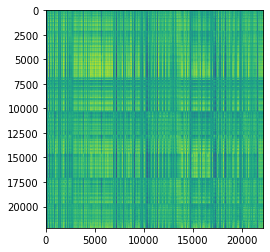

In [14]:
npy_VMV_all = df_VMV_all.iloc[:,:6].to_numpy(dtype = 'float64')

corr = np.corrcoef(npy_VMV_all)

plt.imshow(corr)

In [15]:
corr.shape

(22169, 22169)

In [16]:
d = sch.distance.pdist(corr)

In [17]:
L = sch.linkage(d, method='complete')

In [18]:
threshold_ratio = 0.3
clusters = sch.fcluster(L, threshold_ratio * d.max(), 'distance')
argsort = np.argsort(clusters)[::-1]

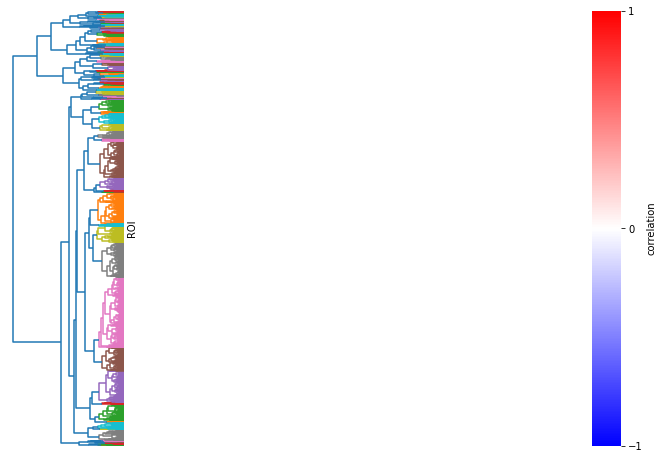

In [22]:
threshold_ratio = 0.25
d = sch.distance.pdist(corr)
L = sch.linkage(d, method='complete')
clusters = sch.fcluster(L, threshold_ratio * d.max(), 'distance')

argsort = np.argsort(clusters)[::-1]

fig, axes = plt.subplots(1, 3, figsize=(11, 8), gridspec_kw=dict(width_ratios=[.2, .8, .05]))
sch.dendrogram(L, orientation='left', ax=axes[0], color_threshold=threshold_ratio*d.max())
sns.heatmap(corr[argsort][:, argsort], vmax=1, vmin=-1, cmap='bwr', ax=axes[1], cbar_ax=axes[2],
            square=True, cbar_kws=dict(ticks=[-1,0,1], label='correlation'))

axes[0].axis('off')
axes[1].set_yticks([])
axes[1].set_xticks([])
axes[1].set_ylabel('ROI')


# fig.suptitle("Hierechical Clustering of stimulus active neurons(n=598 in 9 fish)",fontsize = 20)
fig.subplots_adjust(wspace=0)

In [19]:
clusters

array([ 28, 105,  31, ...,  75,  77,  77], dtype=int32)

In [20]:
npy_VMV_all_cluster = np.c_[npy_VMV_all, clusters]

In [21]:
cluster_idx=np.unique(clusters)
for i in cluster_idx:
    locals()['cluster_'+str(i)+'_roi_idx'] = list(np.where(clusters == i)[0])
    

In [22]:
cluster_idx

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138], dtype=int32)

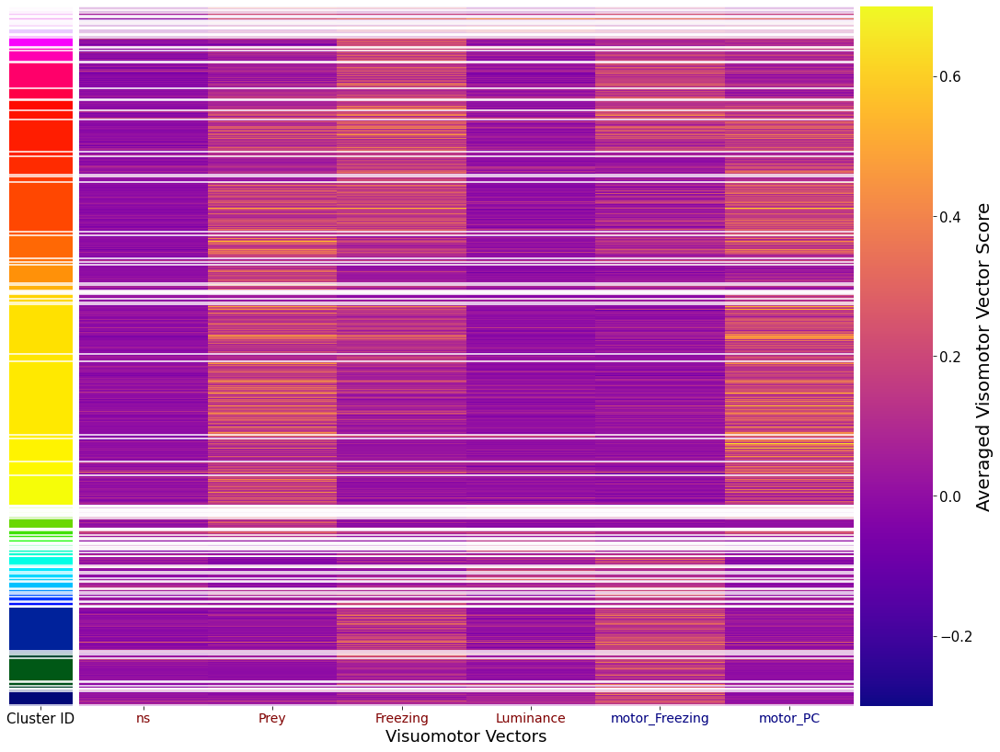

In [23]:
# vmv of different clusters

fig,[ax2,ax1,ax3]= plt.subplots(1,3,figsize = (18,14), gridspec_kw=dict(width_ratios=[.07, .85, .08]))

# fig = plt.figure(figsize = (12,14))
# ax2 = plt.subplot(131, gridspec_kw=dict(width_ratios=[.07, .85, .08]))
# ax1 = plt.subplot(132)
# ax3 = plt.subplot(235)
# d= sch.dendrogram(L, orientation='left', ax=ax4, color_threshold=threshold_ratio*d.max())

argsort = np.argsort(clusters)[::-1]
sns.heatmap(npy_VMV_all_cluster[argsort,:6],cmap = 'plasma',ax = ax1,vmin = -0.3,vmax = 0.7,cbar_ax = ax3)
sns.heatmap(npy_VMV_all_cluster[argsort,-1:],cmap = 'gist_ncar',cbar = False,ax = ax2)

ax1.set_yticks([]) 
ax1.set_xticklabels(visuomotor_list,fontsize = 14)
for i in range(0,4):
    ax1.get_xticklabels()[i].set_color("maroon")
for i in range(4,6):
    ax1.get_xticklabels()[i].set_color("navy")
    
# ax2.set_ylabel('Neurons',fontsize = 18) 
ax2.set_yticks([]) 
ax2.set_xticklabels(['Cluster ID'],fontsize = 15)


line_x = np.where(clusters[argsort][:-1]-clusters[argsort][1:] ==1)
ax1.hlines(line_x , *ax1.get_xlim(),color = 'white',linewidth = 1.5)
ax2.hlines(line_x , *ax1.get_xlim(),color = 'white',linewidth = 1.5)


fig.subplots_adjust(wspace=0.02)

ax1.set_xlabel('Visuomotor Vectors',fontsize = 18)

ax3.set_ylabel('Averaged Visomotor Vector Score',fontsize = 20)
ax3.tick_params(labelsize=15)



# ax4.axis('off')

plt.show()

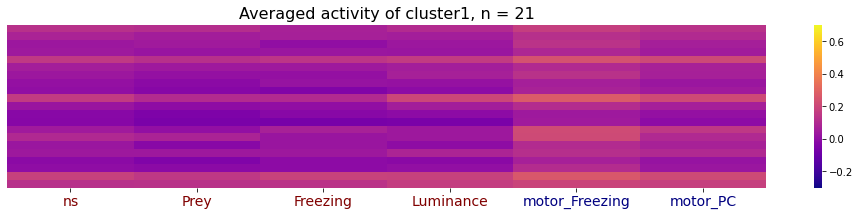

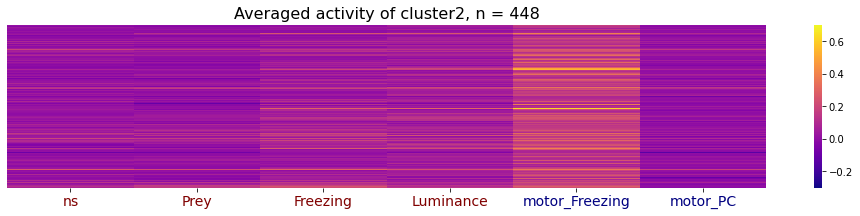

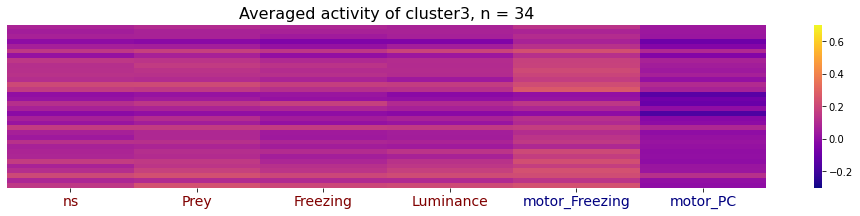

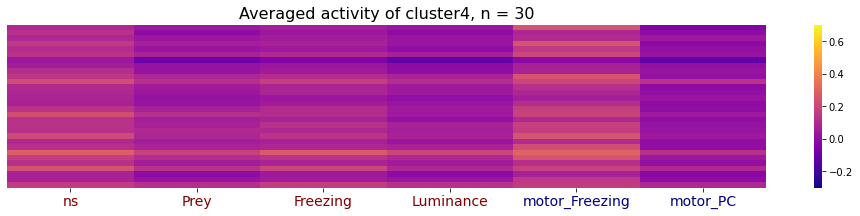

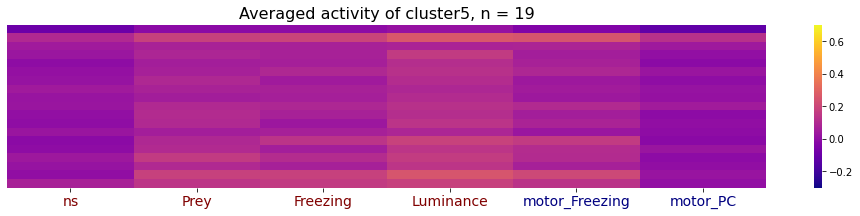

...

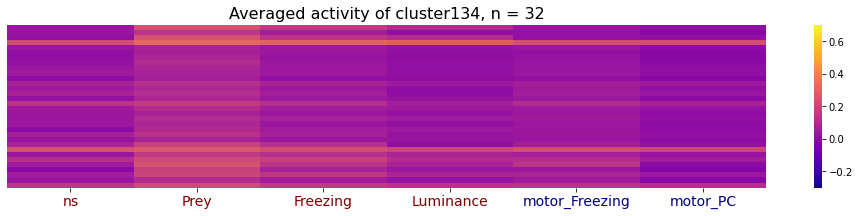

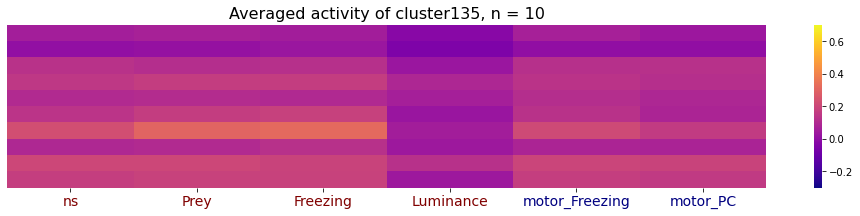

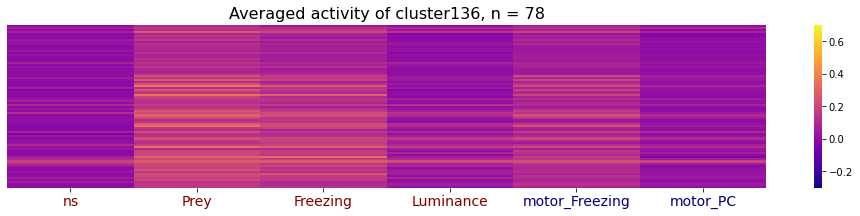

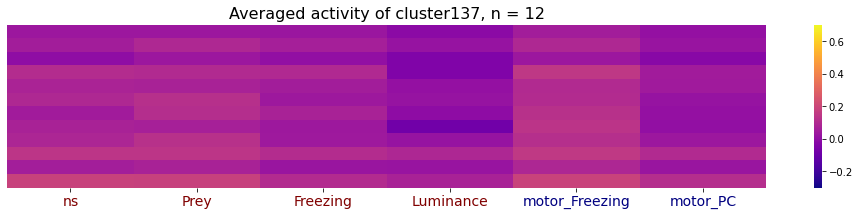

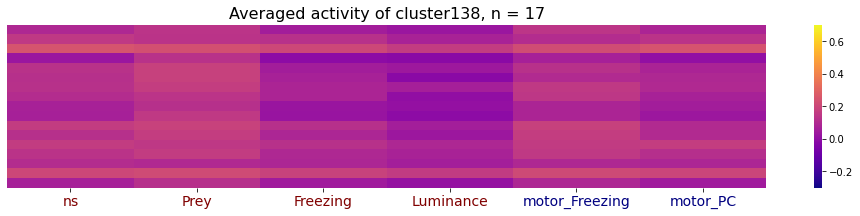

In [24]:
for i in cluster_idx:
    fig,ax1 = plt.subplots(1,1,figsize = (17,3))
    sns.heatmap(npy_VMV_all_cluster[locals()['cluster_'+str(i)+'_roi_idx'],:6],cmap = 'plasma',ax = ax1,vmin = -0.3,vmax = 0.7)
    ax1.set_xticklabels(visuomotor_list,fontsize = 14)
    for j in range(0,4):
        ax1.get_xticklabels()[j].set_color("maroon")
    for k in range(4,6):
        ax1.get_xticklabels()[k].set_color("navy")
    ax1.set_yticks([]) 
    plt.title('Averaged activity of cluster'+str(i)+', n = '+str(len(locals()['cluster_'+str(i)+'_roi_idx'])),fontsize = 16)
    plt.show()
    
    

In [46]:
# export motor freezing related cluster: 2,13,9
df_VMV_motor_freezing_related = pd.DataFrame()
cluster_motor_freezing_related_idx = [2,9,13]
for c_idx in cluster_motor_freezing_related_idx:
    temp_idx = np.where(clusters == c_idx)[0]
    temp_df_VMV = df_VMV_all.loc[temp_idx,:]
    temp_df_VMV['cluster'] = c_idx
    df_VMV_motor_freezing_related = df_VMV_motor_freezing_related.append(temp_df_VMV)
    
df_VMV_motor_freezing_related.to_csv(output_dir+'\\df_VMV_motor_freezing_related_10fish_v5.csv',index=False)

In [40]:
df_VMV_all.loc[np.where(clusters==13)[0],:].

,ns,Prey,Freezing,Luminance,motor_Freezing,motor_PC,ROI_id,Date,Fish,Plane
6,-0.002242,0.007756,0.095031,0.004862,0.136458,0.010093,119,20230312,F1_10_40,1
33,-0.010513,0.005564,0.035085,0.020046,0.061871,0.017837,301,20230312,F1_10_40,2
39,0.000117,0.008190,0.016321,0.003002,0.055161,0.021237,599,20230312,F1_10_40,2
48,-0.017870,0.049565,0.318745,0.093202,0.334174,0.091249,89,20230312,F1_10_40,3
70,0.052230,0.091997,0.149050,0.041831,0.164179,0.058966,272,20230312,F1_10_40,3
...,...,...,...,...,...,...,...,...,...,...
21973,-0.026879,0.021417,0.139361,0.034585,0.124613,0.037566,850,20230410,F4_16_00,8
22026,-0.023962,0.062079,0.141540,0.039156,0.125150,-0.011391,1626,20230410,F4_16_00,8
22027,-0.007536,0.006672,0.118069,-0.003684,0.075658,0.000609,1627,20230410,F4_16_00,8
22034,-0.003313,0.015498,0.107573,-0.005423,0.070169,-0.006375,2161,20230410,F4_16_00,8


In [52]:
for main_dir,fish in zip(main_dir_list,fish_index_list):
    date_no = main_dir.split('\\')[-1]
    for plane_i in range(1,plane_no+1):
        temp_df_coor = pd.DataFrame(columns = ['x','y','z','t','label'])

        slice_no = np.load(main_dir+'\\processed\\'+fish+'\\registration\\reg_2d\\plane'+str(plane_i)+'\\slice_no.npy')
        df_cell_info = pd.read_csv(main_dir+'\\processed\\'+fish+'\\processed_suite2p\\plane'+str(plane_i)+'\\DeltaF_F\\cell_info_'+fish+'.csv')

        for x in df_VMV_all.index:
            if str(df_VMV_all.loc[x,'Date'])==date_no and df_VMV_all.loc[x,'Fish']==fish and df_VMV_all.loc[x,'Plane']==plane_i:
                print(x)
                cell_idx = np.where(df_cell_info.ROI_id == df_VMV_all.loc[x,'ROI_id'])[0][0]
                x_coor = np.array(df_cell_info.centroid_x[cell_idx])*509.12/339.41
                y_coor = np.array(df_cell_info.centroid_y[cell_idx])*509.12/339.41
                temp_df_coor_x = temp_df_coor.shape[0]
                temp_df_coor.loc[temp_df_coor_x,:] = [x_coor,y_coor,slice_no,0,x]
        temp_df_coor.to_csv(main_dir+'\\processed\\'+fish+'\\registration\\reg_2d\\plane'+str(plane_i)+'\\'+fish[:2]+'_'+date_no+'_coordinates.csv',index=False)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142


3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699
3700
3701
3702
3703
3704
3705
3706
3707
3708
3709
3710
3711
3712
3713
3714
3715
3716
3717
3718
3719
3720
3721
3722
3723
3724
3725
3726
3727
3728
3729
3730
3731
3732
3733
3734
3735
3736
3737
3738
3739
3740
3741
3742
3743
3744
3745
3746
3747
3748
3749
3750
3751
3752
3753
3754
3755
3756
3757
3758
3759
3760
3761
3762
3763
3764
3765
3766
3767
3768
3769
3770
3771
3772
3773
3774
3775
3776
3777
3778
3779
3780
3781
3782
3783
3784
3785
3786
3787
3788
3789
3790
3791
3792
3793
3794
3795
3796
3797
3798
3799
3800
3801
3802
3803
3804
3805


5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338
5339
5340
5341
5342
5343
5344
5345
5346
5347
5348
5349
5350
5351
5352
5353
5354
5355
5356
5357
5358
5359
5360
5361
5362
5363
5364
5365
5366
5367
5368
5369
5370
5371
5372
5373
5374
5375
5376
5377
5378
5379
5380
5381
5382
5383
5384
5385
5386
5387
5388
5389
5390
5391
5392
5393
5394
5395
5396
5397
5398
5399
5400
5401
5402
5403
5404
5405
5406
5407
5408
5409
5410
5411
5412
5413
5414
5415
5416
5417
5418
5419
5420
5421
5422
5423
5424
5425
5426
5427
5428
5429
5430
5431
5432
5433
5434
5435
5436
5437
5438
5439
5440
5441
5442
5443
5444
5445
5446
5447
5448
5449
5450
5451
5452
5453
5454
5455
5456
5457
5458
5459
5460
5461
5462
5463
5464
5465
5466
5467
5468
5469
5470
5471
5472
5473
5474
5475
5476
5477
5478
5479
5480
5481
5482
5483
5484
5485
5486
5487
5488
5489
5490
5491
5492
5493
5494
5495
5496
5497
5498
5499


7101
7102
7103
7104
7105
7106
7107
7108
7109
7110
7111
7112
7113
7114
7115
7116
7117
7118
7119
7120
7121
7122
7123
7124
7125
7126
7127
7128
7129
7130
7131
7132
7133
7134
7135
7136
7137
7138
7139
7140
7141
7142
7143
7144
7145
7146
7147
7148
7149
7150
7151
7152
7153
7154
7155
7156
7157
7158
7159
7160
7161
7162
7163
7164
7165
7166
7167
7168
7169
7170
7171
7172
7173
7174
7175
7176
7177
7178
7179
7180
7181
7182
7183
7184
7185
7186
7187
7188
7189
7190
7191
7192
7193
7194
7195
7196
7197
7198
7199
7200
7201
7202
7203
7204
7205
7206
7207
7208
7209
7210
7211
7212
7213
7214
7215
7216
7217
7218
7219
7220
7221
7222
7223
7224
7225
7226
7227
7228
7229
7230
7231
7232
7233
7234
7235
7236
7237
7238
7239
7240
7241
7242
7243
7244
7245
7246
7247
7248
7249
7250
7251
7252
7253
7254
7255
7256
7257
7258
7259
7260
7261
7262
7263
7264
7265
7266
7267
7268
7269
7270
7271
7272
7273
7274
7275
7276
7277
7278
7279
7280
7281
7282
7283
7284
7285
7286
7287
7288
7289
7290
7291
7292
7293
7294
7295
7296
7297
7298
7299
7300


8965
8966
8967
8968
8969
8970
8971
8972
8973
8974
8975
8976
8977
8978
8979
8980
8981
8982
8983
8984
8985
8986
8987
8988
8989
8990
8991
8992
8993
8994
8995
8996
8997
8998
8999
9000
9001
9002
9003
9004
9005
9006
9007
9008
9009
9010
9011
9012
9013
9014
9015
9016
9017
9018
9019
9020
9021
9022
9023
9024
9025
9026
9027
9028
9029
9030
9031
9032
9033
9034
9035
9036
9037
9038
9039
9040
9041
9042
9043
9044
9045
9046
9047
9048
9049
9050
9051
9052
9053
9054
9055
9056
9057
9058
9059
9060
9061
9062
9063
9064
9065
9066
9067
9068
9069
9070
9071
9072
9073
9074
9075
9076
9077
9078
9079
9080
9081
9082
9083
9084
9085
9086
9087
9088
9089
9090
9091
9092
9093
9094
9095
9096
9097
9098
9099
9100
9101
9102
9103
9104
9105
9106
9107
9108
9109
9110
9111
9112
9113
9114
9115
9116
9117
9118
9119
9120
9121
9122
9123
9124
9125
9126
9127
9128
9129
9130
9131
9132
9133
9134
9135
9136
9137
9138
9139
9140
9141
9142
9143
9144
9145
9146
9147
9148
9149
9150
9151
9152
9153
9154
9155
9156
9157
9158
9159
9160
9161
9162
9163
9164


10531
10532
10533
10534
10535
10536
10537
10538
10539
10540
10541
10542
10543
10544
10545
10546
10547
10548
10549
10550
10551
10552
10553
10554
10555
10556
10557
10558
10559
10560
10561
10562
10563
10564
10565
10566
10567
10568
10569
10570
10571
10572
10573
10574
10575
10576
10577
10578
10579
10580
10581
10582
10583
10584
10585
10586
10587
10588
10589
10590
10591
10592
10593
10594
10595
10596
10597
10598
10599
10600
10601
10602
10603
10604
10605
10606
10607
10608
10609
10610
10611
10612
10613
10614
10615
10616
10617
10618
10619
10620
10621
10622
10623
10624
10625
10626
10627
10628
10629
10630
10631
10632
10633
10634
10635
10636
10637
10638
10639
10640
10641
10642
10643
10644
10645
10646
10647
10648
10649
10650
10651
10652
10653
10654
10655
10656
10657
10658
10659
10660
10661
10662
10663
10664
10665
10666
10667
10668
10669
10670
10671
10672
10673
10674
10675
10676
10677
10678
10679
10680
10681
10682
10683
10684
10685
10686
10687
10688
10689
10690
10691
10692
10693
10694
10695
10696
1069

12090
12091
12092
12093
12094
12095
12096
12097
12098
12099
12100
12101
12102
12103
12104
12105
12106
12107
12108
12109
12110
12111
12112
12113
12114
12115
12116
12117
12118
12119
12120
12121
12122
12123
12124
12125
12126
12127
12128
12129
12130
12131
12132
12133
12134
12135
12136
12137
12138
12139
12140
12141
12142
12143
12144
12145
12146
12147
12148
12149
12150
12151
12152
12153
12154
12155
12156
12157
12158
12159
12160
12161
12162
12163
12164
12165
12166
12167
12168
12169
12170
12171
12172
12173
12174
12175
12176
12177
12178
12179
12180
12181
12182
12183
12184
12185
12186
12187
12188
12189
12190
12191
12192
12193
12194
12195
12196
12197
12198
12199
12200
12201
12202
12203
12204
12205
12206
12207
12208
12209
12210
12211
12212
12213
12214
12215
12216
12217
12218
12219
12220
12221
12222
12223
12224
12225
12226
12227
12228
12229
12230
12231
12232
12233
12234
12235
12236
12237
12238
12239
12240
12241
12242
12243
12244
12245
12246
12247
12248
12249
12250
12251
12252
12253
12254
12255
1225

13539
13540
13541
13542
13543
13544
13545
13546
13547
13548
13549
13550
13551
13552
13553
13554
13555
13556
13557
13558
13559
13560
13561
13562
13563
13564
13565
13566
13567
13568
13569
13570
13571
13572
13573
13574
13575
13576
13577
13578
13579
13580
13581
13582
13583
13584
13585
13586
13587
13588
13589
13590
13591
13592
13593
13594
13595
13596
13597
13598
13599
13600
13601
13602
13603
13604
13605
13606
13607
13608
13609
13610
13611
13612
13613
13614
13615
13616
13617
13618
13619
13620
13621
13622
13623
13624
13625
13626
13627
13628
13629
13630
13631
13632
13633
13634
13635
13636
13637
13638
13639
13640
13641
13642
13643
13644
13645
13646
13647
13648
13649
13650
13651
13652
13653
13654
13655
13656
13657
13658
13659
13660
13661
13662
13663
13664
13665
13666
13667
13668
13669
13670
13671
13672
13673
13674
13675
13676
13677
13678
13679
13680
13681
13682
13683
13684
13685
13686
13687
13688
13689
13690
13691
13692
13693
13694
13695
13696
13697
13698
13699
13700
13701
13702
13703
13704
1370

14915
14916
14917
14918
14919
14920
14921
14922
14923
14924
14925
14926
14927
14928
14929
14930
14931
14932
14933
14934
14935
14936
14937
14938
14939
14940
14941
14942
14943
14944
14945
14946
14947
14948
14949
14950
14951
14952
14953
14954
14955
14956
14957
14958
14959
14960
14961
14962
14963
14964
14965
14966
14967
14968
14969
14970
14971
14972
14973
14974
14975
14976
14977
14978
14979
14980
14981
14982
14983
14984
14985
14986
14987
14988
14989
14990
14991
14992
14993
14994
14995
14996
14997
14998
14999
15000
15001
15002
15003
15004
15005
15006
15007
15008
15009
15010
15011
15012
15013
15014
15015
15016
15017
15018
15019
15020
15021
15022
15023
15024
15025
15026
15027
15028
15029
15030
15031
15032
15033
15034
15035
15036
15037
15038
15039
15040
15041
15042
15043
15044
15045
15046
15047
15048
15049
15050
15051
15052
15053
15054
15055
15056
15057
15058
15059
15060
15061
15062
15063
15064
15065
15066
15067
15068
15069
15070
15071
15072
15073
15074
15075
15076
15077
15078
15079
15080
1508

16493
16494
16495
16496
16497
16498
16499
16500
16501
16502
16503
16504
16505
16506
16507
16508
16509
16510
16511
16512
16513
16514
16515
16516
16517
16518
16519
16520
16521
16522
16523
16524
16525
16526
16527
16528
16529
16530
16531
16532
16533
16534
16535
16536
16537
16538
16539
16540
16541
16542
16543
16544
16545
16546
16547
16548
16549
16550
16551
16552
16553
16554
16555
16556
16557
16558
16559
16560
16561
16562
16563
16564
16565
16566
16567
16568
16569
16570
16571
16572
16573
16574
16575
16576
16577
16578
16579
16580
16581
16582
16583
16584
16585
16586
16587
16588
16589
16590
16591
16592
16593
16594
16595
16596
16597
16598
16599
16600
16601
16602
16603
16604
16605
16606
16607
16608
16609
16610
16611
16612
16613
16614
16615
16616
16617
16618
16619
16620
16621
16622
16623
16624
16625
16626
16627
16628
16629
16630
16631
16632
16633
16634
16635
16636
16637
16638
16639
16640
16641
16642
16643
16644
16645
16646
16647
16648
16649
16650
16651
16652
16653
16654
16655
16656
16657
16658
1665

17906
17907
17908
17909
17910
17911
17912
17913
17914
17915
17916
17917
17918
17919
17920
17921
17922
17923
17924
17925
17926
17927
17928
17929
17930
17931
17932
17933
17934
17935
17936
17937
17938
17939
17940
17941
17942
17943
17944
17945
17946
17947
17948
17949
17950
17951
17952
17953
17954
17955
17956
17957
17958
17959
17960
17961
17962
17963
17964
17965
17966
17967
17968
17969
17970
17971
17972
17973
17974
17975
17976
17977
17978
17979
17980
17981
17982
17983
17984
17985
17986
17987
17988
17989
17990
17991
17992
17993
17994
17995
17996
17997
17998
17999
18000
18001
18002
18003
18004
18005
18006
18007
18008
18009
18010
18011
18012
18013
18014
18015
18016
18017
18018
18019
18020
18021
18022
18023
18024
18025
18026
18027
18028
18029
18030
18031
18032
18033
18034
18035
18036
18037
18038
18039
18040
18041
18042
18043
18044
18045
18046
18047
18048
18049
18050
18051
18052
18053
18054
18055
18056
18057
18058
18059
18060
18061
18062
18063
18064
18065
18066
18067
18068
18069
18070
18071
1807

19575
19576
19577
19578
19579
19580
19581
19582
19583
19584
19585
19586
19587
19588
19589
19590
19591
19592
19593
19594
19595
19596
19597
19598
19599
19600
19601
19602
19603
19604
19605
19606
19607
19608
19609
19610
19611
19612
19613
19614
19615
19616
19617
19618
19619
19620
19621
19622
19623
19624
19625
19626
19627
19628
19629
19630
19631
19632
19633
19634
19635
19636
19637
19638
19639
19640
19641
19642
19643
19644
19645
19646
19647
19648
19649
19650
19651
19652
19653
19654
19655
19656
19657
19658
19659
19660
19661
19662
19663
19664
19665
19666
19667
19668
19669
19670
19671
19672
19673
19674
19675
19676
19677
19678
19679
19680
19681
19682
19683
19684
19685
19686
19687
19688
19689
19690
19691
19692
19693
19694
19695
19696
19697
19698
19699
19700
19701
19702
19703
19704
19705
19706
19707
19708
19709
19710
19711
19712
19713
19714
19715
19716
19717
19718
19719
19720
19721
19722
19723
19724
19725
19726
19727
19728
19729
19730
19731
19732
19733
19734
19735
19736
19737
19738
19739
19740
1974

21104
21105
21106
21107
21108
21109
21110
21111
21112
21113
21114
21115
21116
21117
21118
21119
21120
21121
21122
21123
21124
21125
21126
21127
21128
21129
21130
21131
21132
21133
21134
21135
21136
21137
21138
21139
21140
21141
21142
21143
21144
21145
21146
21147
21148
21149
21150
21151
21152
21153
21154
21155
21156
21157
21158
21159
21160
21161
21162
21163
21164
21165
21166
21167
21168
21169
21170
21171
21172
21173
21174
21175
21176
21177
21178
21179
21180
21181
21182
21183
21184
21185
21186
21187
21188
21189
21190
21191
21192
21193
21194
21195
21196
21197
21198
21199
21200
21201
21202
21203
21204
21205
21206
21207
21208
21209
21210
21211
21212
21213
21214
21215
21216
21217
21218
21219
21220
21221
21222
21223
21224
21225
21226
21227
21228
21229
21230
21231
21232
21233
21234
21235
21236
21237
21238
21239
21240
21241
21242
21243
21244
21245
21246
21247
21248
21249
21250
21251
21252
21253
21254
21255
21256
21257
21258
21259
21260
21261
21262
21263
21264
21265
21266
21267
21268
21269
2127

In [53]:
df_VMV_all['cluster'] = clusters
df_VMV_all.to_csv(output_dir+'\\df_VMV_10fish_v5_withcluster.csv',index=False)

In [54]:
df_VMV_all

,ns,Prey,Freezing,Luminance,motor_Freezing,motor_PC,ROI_id,Date,Fish,Plane,cluster
0,-0.002771,-0.011480,0.017802,0.075744,0.069616,-0.012460,2,20230312,F1_10_40,1,28
1,-0.034204,0.006151,0.066258,-0.016371,0.101753,0.019106,21,20230312,F1_10_40,1,105
2,0.024215,-0.056534,0.069677,0.050738,0.157581,-0.032602,29,20230312,F1_10_40,1,31
3,0.062947,0.148363,0.054827,0.038417,0.094476,0.064826,68,20230312,F1_10_40,1,89
4,0.121818,0.072616,0.137535,0.119508,0.191630,0.085086,76,20230312,F1_10_40,1,31
...,...,...,...,...,...,...,...,...,...,...,...
22164,-0.000952,0.075102,0.014993,0.000111,0.007227,0.221803,1909,20230410,F4_16_00,9,75
22165,0.036128,0.110331,0.076558,0.056329,0.096936,0.406527,1924,20230410,F4_16_00,9,81
22166,-0.001430,0.088007,0.032464,-0.008469,0.003691,0.207271,1960,20230410,F4_16_00,9,75
22167,0.000531,0.232828,0.016803,-0.000981,0.007130,0.280522,2084,20230410,F4_16_00,9,77


In [7]:
# DBSCAN 
from sklearn.cluster import DBSCAN,OPTICS


In [55]:
DBSCAN_result = OPTICS(min_samples=8).fit(npy_VMV_all)
DBSCAN_clusters = DBSCAN_result.labels_

In [56]:
npy_VMV_all_cluster_DBSCAN = np.c_[npy_VMV_all, DBSCAN_clusters]

In [57]:
np.max(DBSCAN_clusters)

12

In [58]:
np.sum(DBSCAN_clusters == -1)

18184

In [22]:
DBSCAN_clusters.shape

(18321,)

In [23]:
DBSCAN_clusters

array([-1, -1, -1, ..., 70, -1, -1])

In [51]:
DBSCAN_result2 = DBSCAN(eps = 0.1,min_samples=5).fit(npy_VMV_all)
DBSCAN_clusters2 = DBSCAN_result2.labels_

In [52]:
npy_VMV_all_cluster_DBSCAN2 = np.c_[npy_VMV_all, DBSCAN_clusters2]

In [53]:
np.sum(DBSCAN_clusters2 == -1)

488

In [54]:
np.max(DBSCAN_clusters2)

1

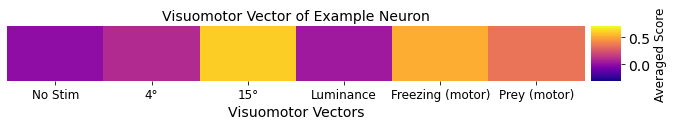

In [20]:
# illustration
temp_score =np.zeros((1,6))
for i,j in zip([0.0,0.1,0.6,0.04,0.52,0.35],range(0,6)):
    temp_score[:,j] = i
    
fig,(ax1,ax2) = plt.subplots(1,2,figsize = (11,1),gridspec_kw=dict(width_ratios=[.95, .05]))
sns.heatmap(temp_score,cmap = 'plasma',ax = ax1,vmin = -0.3,vmax = 0.7,cbar_ax = ax2)
visuomotor_list = ['No Stim', '4°', '15°', 'Luminance', 'Freezing (motor)', 'Prey (motor)']
ax1.set_xticklabels(visuomotor_list,fontsize = 12)
ax1.set_xlabel('Visuomotor Vectors',fontsize = 14)
ax1.set_yticks([]) 
ax2.set_ylabel('Averaged Score',fontsize = 12)
ax2.tick_params(labelsize=14)
ax1.set_title('Visuomotor Vector of Example Neuron',fontsize = 14)

fig.subplots_adjust(wspace=0.02)
plt.show()

In [53]:


for main_dir,fish in zip(main_dir_list,fish_index_list):
    date_no = main_dir.split('\\')[-1]
    for plane_i in range(1,plane_no+1):
        temp_df_coor = pd.DataFrame(columns = ['x','y','z','t','label'])

        slice_no = np.load(main_dir+'\\processed\\'+fish+'\\registration\\reg_2d\\plane'+str(plane_i)+'\\slice_no.npy')
        df_cell_info = pd.read_csv(main_dir+'\\processed\\'+fish+'\\processed_suite2p\\plane'+str(plane_i)+'\\DeltaF_F\\cell_info_'+fish+'.csv')

        for i in cluster_idx:
            temp_df_VMV = df_VMV_all.iloc[locals()['cluster_'+str(i)+'_roi_idx'],:]
            for x in temp_df_VMV.index:
                if str(temp_df_VMV.loc[x,'Date'])==date_no and temp_df_VMV.loc[x,'Fish']==fish and temp_df_VMV.loc[x,'Plane']==plane_i:
                    cell_idx = np.where(df_cell_info.ROI_id == temp_df_VMV.loc[x,'ROI_id'])[0][0]
                    x_coor = np.array(df_cell_info.centroid_x[cell_idx])*509.12/339.41
                    y_coor = np.array(df_cell_info.centroid_y[cell_idx])*509.12/339.41
                    temp_df_coor_x = temp_df_coor.shape[0]
                    temp_df_coor.loc[temp_df_coor_x,:] = [x_coor,y_coor,slice_no,0,i]
        temp_df_coor.to_csv(main_dir+'\\processed\\'+fish+'\\registration\\reg_2d\\plane'+str(plane_i)+'\\'+fish[:2]+'_'+date_no+'_coordinates_v4.csv',index=False)

In [50]:
temp_df_coor

,x,y,z,t,label
0,424,225,195,0,9
1,476,437,195,0,18
2,464,427,195,0,18
3,476,417,195,0,18
4,44,175,195,0,18
...,...,...,...,...,...
61,50,231,195,0,28
62,77,216,195,0,28
63,48,213,195,0,28
64,78,185,195,0,28


In [ ]:
main_dir = 'D:\\LCr_UV_HSA_Luminance_4\\'
cluster_idx = cluster_7_roi_idx+cluster_9_roi_idx+cluster_10_roi_idx

temp_df_ROI_info = df_ROI_info_all.iloc[cluster_idx,:]
for date_no in np.unique(temp_df_ROI_info.Date):
    temp_df_ROI_info_date = temp_df_ROI_info[temp_df_ROI_info.Date==date_no]
    for fish in np.unique(temp_df_ROI_info_date.Fish):
        temp_df_ROI_info_fish = temp_df_ROI_info_date[temp_df_ROI_info_date.Fish==fish]
        for plane in np.unique(temp_df_ROI_info_fish.Plane):
            temp_df_ROI_info_plane = temp_df_ROI_info_fish[temp_df_ROI_info_fish.Plane==plane]
            df_cell_info = pd.read_csv(main_dir+date_no+'\\processed\\'+fish+'\\processed_suite2p\\plane'+str(plane)+'\\DeltaF_F\\cell_info_'+fish+'.csv')
            
            temp_cell_idx_list = []
            for ROI_id in temp_df_ROI_info_plane.ROI_id:
                temp_cell_idx_list.append(np.where(df_cell_info.ROI_id == ROI_id)[0][0])
                
            x_coor = np.array(df_cell_info.centroid_x[temp_cell_idx_list])
            y_coor = np.array(df_cell_info.centroid_y[temp_cell_idx_list])
            radius_list = np.array(df_cell_info.radius[temp_cell_idx_list])
            
            
            file = main_dir+date_no+'\\processed\\'+fish+'\\processed_suite2p\\plane'+str(plane)+'\\plane0\\reg_tif\\file000_chan0.tif'
            temp_tif = tifffile.imread(file)
#             temp_average_tif = np.average(temp_tif,axis = (1,2))
        #     print(temp_average_tif.shape)
#             temp_frame = np.argmax(temp_average_tif)
            plt.figure(figsize = (5,5))
            ax_baseline = sns.heatmap(temp_tif, cmap='gray', vmin=0, vmax=255,square = True,cbar = False)
            ax_baseline.scatter(x_coor,y_coor,radius_list*1.5,c = 'r')
            ax_baseline.tick_params(left=False, bottom=False)
            ax_baseline.axis('off')
            plt.title(fish[:2]+' '+date_no+' Plane'+str(plane))
            plt.show()

In [43]:
df_VMV_all.iloc[locals()['cluster_'+str(i)+'_roi_idx'],:]

,ns,Prey,Freezing,Luminance,only_PC,only_Bradycardia,ROI_id,Date,Fish,Plane
3,0.050316,0.155563,0.263045,0.031847,0.163423,0.203441,219,20230102,F2_16_00,1
13,-0.008445,0.039905,0.174613,-0.011391,0.075403,0.085838,558,20230102,F2_16_00,2
16,0.022841,0.088454,0.243337,0.019164,0.126351,0.140699,1472,20230102,F2_16_00,2
21,0.038629,0.200662,0.365586,0.042259,0.235637,0.129388,335,20230102,F2_16_00,3
26,0.003918,0.092327,0.192086,-0.000079,0.117154,0.081449,577,20230102,F2_16_00,3
...,...,...,...,...,...,...,...,...,...,...
3952,-0.010247,0.396712,0.437246,0.172380,0.388454,0.402725,2239,20230130,F6_19_30,9
3953,-0.000271,0.284897,0.267601,0.063237,0.271940,0.260558,2257,20230130,F6_19_30,9
3955,0.017107,0.183697,0.162834,-0.001758,0.142284,0.135496,2406,20230130,F6_19_30,9
3958,-0.000555,0.287302,0.456285,0.130043,0.344907,0.373477,2582,20230130,F6_19_30,9


In [57]:
df_VMV_all

,ns,Prey,Freezing,Luminance,only_PC,only_Bradycardia,ROI_id,Date,Fish,Plane
0,0.008483,0.060063,0.199861,-0.001224,0.100716,0.008906,96,20230102,F2_16_00,1
1,0.056943,0.101912,0.130700,0.055827,0.082280,0.016494,116,20230102,F2_16_00,1
2,0.043882,0.206488,0.023490,0.074972,0.175490,0.027529,189,20230102,F2_16_00,1
3,0.050316,0.155563,0.263045,0.031847,0.163423,0.203441,219,20230102,F2_16_00,1
4,0.034921,-0.012835,0.361470,0.094158,0.033196,-0.015575,276,20230102,F2_16_00,1
...,...,...,...,...,...,...,...,...,...,...
3956,0.003039,0.231908,0.246922,0.045210,0.223176,0.150643,2441,20230130,F6_19_30,9
3957,0.004604,0.260836,0.096259,-0.003936,0.238790,0.059590,2469,20230130,F6_19_30,9
3958,-0.000555,0.287302,0.456285,0.130043,0.344907,0.373477,2582,20230130,F6_19_30,9
3959,-0.003243,0.225490,0.291295,0.002057,0.225103,0.124258,2791,20230130,F6_19_30,9


In [86]:
np.add(temp_averaged_score,np.array(listr2) * np.array(listr2))

array([7.46446699e-06, 6.23474420e-02, 2.29384036e-02, 6.67065709e-02,
       1.95448783e-02, 1.63116143e-01])

D:\LCr_UV_HSA_Luminance_4\20230102\processed\F2_16_00\processed_suite2p\plane1\DeltaF_F\F2_16_00_Trial1.csv
D:\LCr_UV_HSA_Luminance_4\20230102\processed\F2_16_00\processed_suite2p\plane1\DeltaF_F\F2_16_00_Trial2.csv
D:\LCr_UV_HSA_Luminance_4\20230102\processed\F2_16_00\processed_suite2p\plane1\DeltaF_F\F2_16_00_Trial3.csv
D:\LCr_UV_HSA_Luminance_4\20230102\processed\F2_16_00\processed_suite2p\plane1\DeltaF_F\F2_16_00_Trial4.csv
D:\LCr_UV_HSA_Luminance_4\20230102\processed\F2_16_00\processed_suite2p\plane1\DeltaF_F\F2_16_00_Trial5.csv
D:\LCr_UV_HSA_Luminance_4\20230102\processed\F2_16_00\processed_suite2p\plane1\DeltaF_F\F2_16_00_Trial6.csv
D:\LCr_UV_HSA_Luminance_4\20230102\processed\F2_16_00\processed_suite2p\plane1\DeltaF_F\F2_16_00_Trial7.csv
D:\LCr_UV_HSA_Luminance_4\20230102\processed\F2_16_00\processed_suite2p\plane1\DeltaF_F\F2_16_00_Trial8.csv
D:\LCr_UV_HSA_Luminance_4\20230102\processed\F2_16_00\processed_suite2p\plane1\DeltaF_F\F2_16_00_Trial9.csv
D:\LCr_UV_HSA_Luminance_4\20

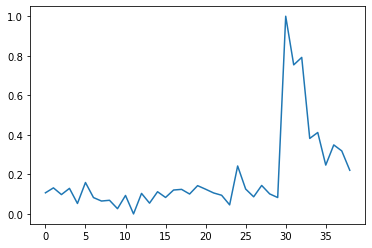

roi no. is 81
coeffcient is [[0.66242864]]
R2 is 0.7018781752639395


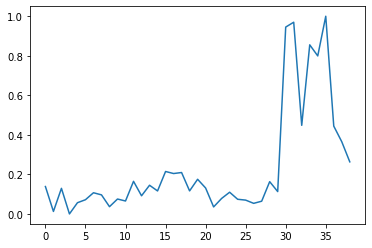

roi no. is 81
coeffcient is [[0.82290719]]
R2 is 0.628427484060549


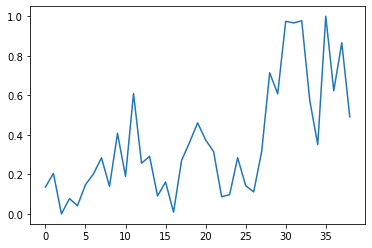

roi no. is 160
coeffcient is [[0.85528966]]
R2 is 0.6376142823404318


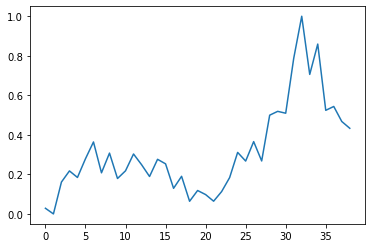

roi no. is 160
coeffcient is [[0.68005275]]
R2 is 0.6492077209731225


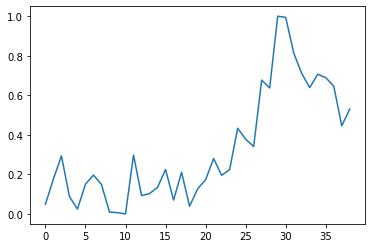

roi no. is 226
coeffcient is [[0.90759267]]
R2 is 0.7521764998562868


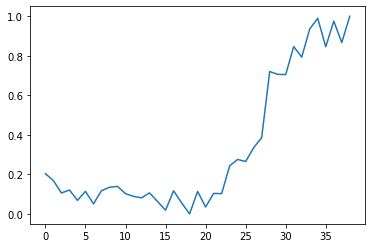

roi no. is 226
coeffcient is [[0.99560111]]
R2 is 0.6284469235662603


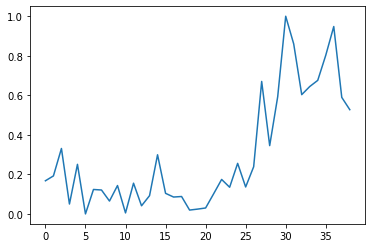

roi no. is 226
coeffcient is [[0.87385025]]
R2 is 0.6733607736056525


KeyboardInterrupt: 

In [59]:
# 20230102 F2

main_dir = "D:\\LCr_UV_HSA_Luminance_4\\20230102"
date_no = main_dir.split('\\')[-1]
fish_index_list =['F2_16_00']

stim_list = ['ns','Prey','Freezing','Luminance']
time_len = 39
plane_no = 9

for i in range(0,len(fish_index_list)):   
    # vsinfo
    vsinfo = pd.read_excel(main_dir+'\\behavior\\'+fish_index_list[i]+'//vsinfo_'+date_no+'_'+fish_index_list[i]+'.xlsx')
    trial_no = vsinfo.shape[0]
    stim_trial_idx = [i+1 for i in np.where(vsinfo.Left_Stimulus_Type=='m')[0]]+[i+1 for i in np.where(vsinfo.Right_Stimulus_Type=='m')[0]]
    
    # every trial's data
    for plane_i in range(1,plane_no+1):
        for t in range(1,trial_no+1):
            locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)+'_dir'] = main_dir+'\\processed\\'+fish_index_list[i]+'\\processed_suite2p\\plane'+str(plane_i)+'\\DeltaF_F\\'+fish_index_list[i]+'_Trial'+str(t)+".csv"
            print(locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)+'_dir'])
            locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)] = pd.read_csv(locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)+'_dir'])


        # roi number
        locals()['roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)] = locals()['df_'+date_no+'_'+str(fish_index_list[i])+'_p'+str(plane_i)+'_trial_1'].shape[0]
        print(date_no + str(fish_index_list[i])+' plane'+str(plane_i)+' roi number is ' + str(locals()['roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)]))

        locals()['active_roi_idx_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)] = list()
        for roi_i in range(0,locals()['roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)]):
            temp_activity = np.zeros([len(stim_trial_idx),time_len])
            temp_activity_normed = np.zeros([len(stim_trial_idx),time_len])
            temp_active_no = 0
            for j in range(0,len(stim_trial_idx)):
                temp_activity[j] = locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(stim_trial_idx[j])].iloc[roi_i,range(0,time_len)].values
                if np.max(temp_activity[j])>0.2:
                    temp_activity_normed[j] = (temp_activity[j]-min(temp_activity[j]))/(max(temp_activity[j])-min(temp_activity[j]))
            listregintercept,listregcoeff,listr2 = get_regression(temp_activity_normed)
            for temp_i in range(0,len(listr2)):
                if  listregcoeff[temp_i] > 0.5 and listr2[temp_i]>0.5:
                    
                    temp_active_no = temp_active_no+1
    #         print(temp_active_no)
            if temp_active_no>=3:
                locals()['active_roi_idx_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)].append(roi_i)
                for temp_i in range(0,len(listr2)):
                    if  listregcoeff[temp_i] > 0.5 and listr2[temp_i]>0.6:
                        plt.plot(temp_activity_normed[temp_i])
                        plt.show()
                        print('roi no. is '+str(roi_i))
                        print('coeffcient is '+str(listregcoeff[temp_i]))
                        print('R2 is '+str(listr2[temp_i]))
        for t in range(1,trial_no+1):
            locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)] = locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)].iloc[locals()['active_roi_idx_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)],:]

         # active roi number
        locals()['active_roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)] = locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)].shape[0]
        print(date_no + str(fish_index_list[i])+' plane'+str(plane_i)+' active roi number is ' + str(locals()['active_roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)])) 



In [60]:
stim_list = ['ns','Prey','Freezing','Luminance']
    

for i in range(0,len(stim_list)):
# for i in range(1,2): 
    list_trace_temp = list()
    list_info_temp = list()
    for fish_i in range(0,len(fish_index_list)):
        vsinfo = pd.read_excel(main_dir+'\\behavior\\'+fish_index_list[fish_i]+'//vsinfo_'+date_no+'_'+fish_index_list[fish_i]+'.xlsx')
        trial_no = vsinfo.shape[0]
        
        for ii in range(0,len(stim_list)):
            locals()['Index_'+str(stim_list[ii])] = []
        for t in range(0,trial_no):
            if vsinfo.Left_Stimulus_Type[t] == 'n' and vsinfo.Right_Stimulus_Type[t] == 'n':
                Index_ns.append(t+1)
            if vsinfo.Left_Stimulus_Type[t] == 'lum' or vsinfo.Right_Stimulus_Type[t] == 'lum':
                Index_Luminance.append(t+1)
            if vsinfo.Left_Stimulus_Type[t] == 'm' or vsinfo.Right_Stimulus_Type[t] == 'm':
                if vsinfo.Left_Stimulus_Size[t] + vsinfo.Right_Stimulus_Size[t] == 15:
                    Index_Freezing.append(t+1)
                if vsinfo.Left_Stimulus_Size[t] + vsinfo.Right_Stimulus_Size[t] == 4:
                    Index_Prey.append(t+1)
        index_temp = locals()['Index_'+str(stim_list[i])]
        print(index_temp)
        for plane_i in range(1,plane_no+1):
            locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)] = pd.DataFrame(columns = locals()['df_'+date_no+'_'+fish_index_list[fish_i]+'_p'+str(plane_i)+'_trial_1'].iloc[:,range(0,time_len)].columns, index = locals()['df_'+date_no+'_'+fish_index_list[fish_i]+'_p'+str(plane_i)+'_trial_1'].iloc[:,range(0,time_len)].index)
            locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].loc[:,:] = 0
            len_temp = len(index_temp)
            #####
            print(index_temp)
            print(['df_averaged_'+date_no+fish_index_list[fish_i] +' plane'+str(plane_i) +' is'])
            print(locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)])
            ######
            for t in index_temp:
                # then we need to average all the rows of dfs in this index
                df_name_temp = 'df_'+date_no+'_'+fish_index_list[fish_i]+'_p'+str(plane_i)+'_trial_'+str(t)
                # debug part
    #             print(locals()[df_name_temp].iloc[:,range(2,94)].shape)
    #             print(locals()['df_averaged_'+fish_index_list[fish_i]])
                locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)] = locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)] + locals()[df_name_temp].iloc[:,range(0,time_len)]/len_temp
            
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)] = pd.DataFrame(columns = ['Date','Fish','Plane','ROI_id'])
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].ROI_id = locals()['df_'+date_no+'_'+fish_index_list[fish_i]+'_p'+str(plane_i)+'_trial_'+str(index_temp[0])].ROI_id
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].Date = date_no
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].Fish = fish_index_list[fish_i]
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].Plane = plane_i
            
            list_trace_temp.append(locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)])
            list_info_temp.append(locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)])
    locals()['df_averaged_stim_'+date_no+'_'+str(stim_list[i])] = pd.concat(list_trace_temp)
    locals()['df_ROI_info_'+date_no] = pd.concat(list_info_temp)
    

# concat different stimulus's data
df_averaged_stim_list = []
for i in range(0,len(stim_list)):
    df_averaged_stim_list.append(locals()['df_averaged_stim_'+date_no+'_'+str(stim_list[i])])
Jan2_clustering_data = pd.concat(df_averaged_stim_list, axis=1)

locals()['df_ROI_info_'+date_no].index = range(0,locals()['df_ROI_info_'+date_no].shape[0])
Jan2_clustering_data.index = range(0,Jan2_clustering_data.shape[0])


# npy_clustering_data = clustering_data.to_numpy(dtype = 'float64')
# npy_clustering_data.shape

[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230102F2_16_00 plane1 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
0    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
3    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
4    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
..  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
936  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
937  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
938  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
939  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
940  0  0  0

[1, 7, 15, 21, 29, 35, 37, 43]
['df_averaged_20230102F2_16_00 plane5 is']
Empty DataFrame
Columns: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38]
Index: []

[0 rows x 39 columns]
[1, 7, 15, 21, 29, 35, 37, 43]
['df_averaged_20230102F2_16_00 plane6 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
0     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
3     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
4     0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
2329  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2330  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
2331  0  0  0  0 

In [10]:
#20230109 F3 F4

main_dir = "D:\\LCr_UV_HSA_Luminance_5\\20230109"
date_no = main_dir.split('\\')[-1]
fish_index_list =['F3_20_30','F4_22_30']

stim_list = ['ns','Prey','Freezing','Luminance']
time_len = 39
plane_no = 9

for i in range(0,len(fish_index_list)):   
    # vsinfo
    vsinfo = pd.read_excel(main_dir+'\\behavior\\'+fish_index_list[i]+'//vsinfo_'+date_no+'_'+fish_index_list[i]+'.xlsx')
    trial_no = vsinfo.shape[0]
    stim_trial_idx = [i+1 for i in np.where(vsinfo.Left_Stimulus_Type=='m')[0]]+[i+1 for i in np.where(vsinfo.Right_Stimulus_Type=='m')[0]]
    
    # every trial's data
    for plane_i in range(1,plane_no+1):
        for t in range(1,trial_no+1):
            locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)+'_dir'] = main_dir+'\\processed\\'+fish_index_list[i]+'\\processed_suite2p\\plane'+str(plane_i)+'\\DeltaF_F\\'+fish_index_list[i]+'_Trial'+str(t)+".csv"
            print(locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)+'_dir'])
            locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)] = pd.read_csv(locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)+'_dir'])


        # roi number
        locals()['roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)] = locals()['df_'+date_no+'_'+str(fish_index_list[i])+'_p'+str(plane_i)+'_trial_1'].shape[0]
        print(date_no + str(fish_index_list[i])+' plane'+str(plane_i)+' roi number is ' + str(locals()['roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)]))

        locals()['active_roi_idx_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)] = list()
        for roi_i in range(0,locals()['roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)]):
            temp_activity = np.zeros([len(stim_trial_idx),time_len])
            temp_activity_normed = np.zeros([len(stim_trial_idx),time_len])
            temp_active_no = 0
            for j in range(0,len(stim_trial_idx)):
                temp_activity[j] = locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(stim_trial_idx[j])].iloc[roi_i,range(0,time_len)].values
                if np.max(temp_activity[j])>0.2:
                    temp_activity_normed[j] = (temp_activity[j]-min(temp_activity[j]))/(max(temp_activity[j])-min(temp_activity[j]))
            listregintercept,listregcoeff,listr2 = get_regression(temp_activity_normed)
            for temp_i in range(0,len(listr2)):
                if  listregcoeff[temp_i] > 0.5 and listr2[temp_i]>0.6:
                    temp_active_no = temp_active_no+1
    #         print(temp_active_no)
            if temp_active_no>=3:
                locals()['active_roi_idx_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)].append(roi_i)
        for t in range(1,trial_no+1):
            locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)] = locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)].iloc[locals()['active_roi_idx_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)],:]

         # active roi number
        locals()['active_roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)] = locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)].shape[0]
        print(date_no + str(fish_index_list[i])+' plane'+str(plane_i)+' active roi number is ' + str(locals()['active_roi_num_'+date_no+str(fish_index_list[i])+'_p'+str(plane_i)])) 


D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane1\DeltaF_F\F3_20_30_Trial1.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane1\DeltaF_F\F3_20_30_Trial2.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane1\DeltaF_F\F3_20_30_Trial3.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane1\DeltaF_F\F3_20_30_Trial4.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane1\DeltaF_F\F3_20_30_Trial5.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane1\DeltaF_F\F3_20_30_Trial6.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane1\DeltaF_F\F3_20_30_Trial7.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane1\DeltaF_F\F3_20_30_Trial8.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane1\DeltaF_F\F3_20_30_Trial9.csv
D:\LCr_UV_HSA_Luminance_5\20

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane2\DeltaF_F\F3_20_30_Trial33.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane2\DeltaF_F\F3_20_30_Trial34.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane2\DeltaF_F\F3_20_30_Trial35.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane2\DeltaF_F\F3_20_30_Trial36.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane2\DeltaF_F\F3_20_30_Trial37.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane2\DeltaF_F\F3_20_30_Trial38.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane2\DeltaF_F\F3_20_30_Trial39.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane2\DeltaF_F\F3_20_30_Trial40.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane2\DeltaF_F\F3_20_30_Trial41.csv
D:\LCr_UV_HSA_Lumin

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane4\DeltaF_F\F3_20_30_Trial13.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane4\DeltaF_F\F3_20_30_Trial14.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane4\DeltaF_F\F3_20_30_Trial15.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane4\DeltaF_F\F3_20_30_Trial16.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane4\DeltaF_F\F3_20_30_Trial17.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane4\DeltaF_F\F3_20_30_Trial18.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane4\DeltaF_F\F3_20_30_Trial19.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane4\DeltaF_F\F3_20_30_Trial20.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane4\DeltaF_F\F3_20_30_Trial21.csv
D:\LCr_UV_HSA_Lumin

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane5\DeltaF_F\F3_20_30_Trial43.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane5\DeltaF_F\F3_20_30_Trial44.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane5\DeltaF_F\F3_20_30_Trial45.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane5\DeltaF_F\F3_20_30_Trial46.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane5\DeltaF_F\F3_20_30_Trial47.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane5\DeltaF_F\F3_20_30_Trial48.csv
20230109F3_20_30 plane5 roi number is 1959
20230109F3_20_30 plane5 active roi number is 79
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane6\DeltaF_F\F3_20_30_Trial1.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane6\DeltaF_F\F3_20_30_Trial2.csv
D:\LCr_UV_HSA_Luminance_5\20230109\proc

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane7\DeltaF_F\F3_20_30_Trial23.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane7\DeltaF_F\F3_20_30_Trial24.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane7\DeltaF_F\F3_20_30_Trial25.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane7\DeltaF_F\F3_20_30_Trial26.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane7\DeltaF_F\F3_20_30_Trial27.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane7\DeltaF_F\F3_20_30_Trial28.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane7\DeltaF_F\F3_20_30_Trial29.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane7\DeltaF_F\F3_20_30_Trial30.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane7\DeltaF_F\F3_20_30_Trial31.csv
D:\LCr_UV_HSA_Lumin

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane9\DeltaF_F\F3_20_30_Trial4.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane9\DeltaF_F\F3_20_30_Trial5.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane9\DeltaF_F\F3_20_30_Trial6.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane9\DeltaF_F\F3_20_30_Trial7.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane9\DeltaF_F\F3_20_30_Trial8.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane9\DeltaF_F\F3_20_30_Trial9.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane9\DeltaF_F\F3_20_30_Trial10.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane9\DeltaF_F\F3_20_30_Trial11.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F3_20_30\processed_suite2p\plane9\DeltaF_F\F3_20_30_Trial12.csv
D:\LCr_UV_HSA_Luminance_5

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane1\DeltaF_F\F4_22_30_Trial35.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane1\DeltaF_F\F4_22_30_Trial36.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane1\DeltaF_F\F4_22_30_Trial37.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane1\DeltaF_F\F4_22_30_Trial38.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane1\DeltaF_F\F4_22_30_Trial39.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane1\DeltaF_F\F4_22_30_Trial40.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane1\DeltaF_F\F4_22_30_Trial41.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane1\DeltaF_F\F4_22_30_Trial42.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane1\DeltaF_F\F4_22_30_Trial43.csv
D:\LCr_UV_HSA_Lumin

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane3\DeltaF_F\F4_22_30_Trial13.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane3\DeltaF_F\F4_22_30_Trial14.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane3\DeltaF_F\F4_22_30_Trial15.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane3\DeltaF_F\F4_22_30_Trial16.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane3\DeltaF_F\F4_22_30_Trial17.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane3\DeltaF_F\F4_22_30_Trial18.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane3\DeltaF_F\F4_22_30_Trial19.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane3\DeltaF_F\F4_22_30_Trial20.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane3\DeltaF_F\F4_22_30_Trial21.csv
D:\LCr_UV_HSA_Lumin

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane4\DeltaF_F\F4_22_30_Trial40.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane4\DeltaF_F\F4_22_30_Trial41.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane4\DeltaF_F\F4_22_30_Trial42.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane4\DeltaF_F\F4_22_30_Trial43.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane4\DeltaF_F\F4_22_30_Trial44.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane4\DeltaF_F\F4_22_30_Trial45.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane4\DeltaF_F\F4_22_30_Trial46.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane4\DeltaF_F\F4_22_30_Trial47.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane4\DeltaF_F\F4_22_30_Trial48.csv
20230109F4_22_30 pl

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane6\DeltaF_F\F4_22_30_Trial20.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane6\DeltaF_F\F4_22_30_Trial21.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane6\DeltaF_F\F4_22_30_Trial22.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane6\DeltaF_F\F4_22_30_Trial23.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane6\DeltaF_F\F4_22_30_Trial24.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane6\DeltaF_F\F4_22_30_Trial25.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane6\DeltaF_F\F4_22_30_Trial26.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane6\DeltaF_F\F4_22_30_Trial27.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane6\DeltaF_F\F4_22_30_Trial28.csv
D:\LCr_UV_HSA_Lumin

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane7\DeltaF_F\F4_22_30_Trial48.csv
20230109F4_22_30 plane7 roi number is 2025
20230109F4_22_30 plane7 active roi number is 76
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane8\DeltaF_F\F4_22_30_Trial1.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane8\DeltaF_F\F4_22_30_Trial2.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane8\DeltaF_F\F4_22_30_Trial3.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane8\DeltaF_F\F4_22_30_Trial4.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane8\DeltaF_F\F4_22_30_Trial5.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane8\DeltaF_F\F4_22_30_Trial6.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane8\DeltaF_F\F4_22_30_Trial7.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed

D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane9\DeltaF_F\F4_22_30_Trial29.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane9\DeltaF_F\F4_22_30_Trial30.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane9\DeltaF_F\F4_22_30_Trial31.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane9\DeltaF_F\F4_22_30_Trial32.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane9\DeltaF_F\F4_22_30_Trial33.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane9\DeltaF_F\F4_22_30_Trial34.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane9\DeltaF_F\F4_22_30_Trial35.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane9\DeltaF_F\F4_22_30_Trial36.csv
D:\LCr_UV_HSA_Luminance_5\20230109\processed\F4_22_30\processed_suite2p\plane9\DeltaF_F\F4_22_30_Trial37.csv
D:\LCr_UV_HSA_Lumin

In [11]:
stim_list = ['ns','Prey','Freezing','Luminance']
    

for i in range(0,len(stim_list)):
# for i in range(1,2): 
    list_trace_temp = list()
    list_info_temp = list()
    for fish_i in range(0,len(fish_index_list)):
        vsinfo = pd.read_excel(main_dir+'\\behavior\\'+fish_index_list[fish_i]+'//vsinfo_'+date_no+'_'+fish_index_list[fish_i]+'.xlsx')
        trial_no = vsinfo.shape[0]
        
        for ii in range(0,len(stim_list)):
            locals()['Index_'+str(stim_list[ii])] = []
        for t in range(0,trial_no):
            if vsinfo.Left_Stimulus_Type[t] == 'n' and vsinfo.Right_Stimulus_Type[t] == 'n':
                Index_ns.append(t+1)
            if vsinfo.Left_Stimulus_Type[t] == 'lum' or vsinfo.Right_Stimulus_Type[t] == 'lum':
                Index_Luminance.append(t+1)
            if vsinfo.Left_Stimulus_Type[t] == 'm' or vsinfo.Right_Stimulus_Type[t] == 'm':
                if vsinfo.Left_Stimulus_Size[t] + vsinfo.Right_Stimulus_Size[t] == 15:
                    Index_Freezing.append(t+1)
                if vsinfo.Left_Stimulus_Size[t] + vsinfo.Right_Stimulus_Size[t] == 4:
                    Index_Prey.append(t+1)
        index_temp = locals()['Index_'+str(stim_list[i])]
        print(index_temp)
        for plane_i in range(1,plane_no+1):
            locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)] = pd.DataFrame(columns = locals()['df_'+date_no+'_'+fish_index_list[fish_i]+'_p'+str(plane_i)+'_trial_1'].iloc[:,range(0,time_len)].columns, index = locals()['df_'+date_no+'_'+fish_index_list[fish_i]+'_p'+str(plane_i)+'_trial_1'].iloc[:,range(0,time_len)].index)
            locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].loc[:,:] = 0
            len_temp = len(index_temp)
            #####
            print(index_temp)
            print(['df_averaged_'+date_no+fish_index_list[fish_i] +' plane'+str(plane_i) +' is'])
            print(locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)])
            ######
            for t in index_temp:
                # then we need to average all the rows of dfs in this index
                df_name_temp = 'df_'+date_no+'_'+fish_index_list[fish_i]+'_p'+str(plane_i)+'_trial_'+str(t)
                # debug part
    #             print(locals()[df_name_temp].iloc[:,range(2,94)].shape)
    #             print(locals()['df_averaged_'+fish_index_list[fish_i]])
                locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)] = locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)] + locals()[df_name_temp].iloc[:,range(0,time_len)]/len_temp
            
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)] = pd.DataFrame(columns = ['Date','Fish','Plane','ROI_id'])
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].ROI_id = locals()['df_'+date_no+'_'+fish_index_list[fish_i]+'_p'+str(plane_i)+'_trial_'+str(index_temp[0])].ROI_id
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].Date = date_no
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].Fish = fish_index_list[fish_i]
            locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)].Plane = plane_i
            
            list_trace_temp.append(locals()['df_averaged_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)])
            list_info_temp.append(locals()['df_ROI_info_'+date_no+fish_index_list[fish_i]+'_p'+str(plane_i)])
    locals()['df_averaged_stim_'+date_no+'_'+str(stim_list[i])] = pd.concat(list_trace_temp)
    locals()['df_ROI_info_'+date_no] = pd.concat(list_info_temp)
    

# concat different stimulus's data
df_averaged_stim_list = []
for i in range(0,len(stim_list)):
    df_averaged_stim_list.append(locals()['df_averaged_stim_'+date_no+'_'+str(stim_list[i])])
Jan9_clustering_data = pd.concat(df_averaged_stim_list, axis=1)

locals()['df_ROI_info_'+date_no].index = range(0,locals()['df_ROI_info_'+date_no].shape[0])
Jan9_clustering_data.index = range(0,Jan9_clustering_data.shape[0])



[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230109F3_20_30 plane1 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
121  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
355  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[2 rows x 39 columns]
[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230109F3_20_30 plane2 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
359  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
370  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
412  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
706  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
753  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0 

[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230109F4_22_30 plane1 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
99   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
209  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
345  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
377  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
430  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
525  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
784  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
922  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
948  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[9 rows x 39 columns]
[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 3

[2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48]
['df_averaged_20230109F4_22_30 plane6 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
126   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
190   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
192   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
197   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
204   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1577  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1713  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1768  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1836  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1863  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[69 rows x 39 columns]


[1, 7, 17, 23, 29, 35, 37, 43]
['df_averaged_20230109F3_20_30 plane4 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
68    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
108   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
155   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
198   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
230   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1441  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1475  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1477  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1480  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1600  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[63 rows x 39 columns]
[1, 7, 17, 23, 29, 35, 37, 43]
['df_averaged_20230109F3_20_30 

      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
79    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
137   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
205   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
226   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
229   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1553  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1614  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1636  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1760  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1853  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[68 rows x 39 columns]
[5, 11, 15, 21, 29, 35, 37, 43]
['df_averaged_20230109F4_22_30 plane6 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 

[5 rows x 39 columns]
[3, 9, 13, 19, 25, 31, 41, 47]
['df_averaged_20230109F3_20_30 plane3 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
80    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
176   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
291   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
370   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
407   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
510   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
552   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
706   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
753   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
765   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
816   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
825   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0 

[1, 7, 17, 23, 27, 33, 41, 47]
['df_averaged_20230109F4_22_30 plane3 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
61    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
114   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
202   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
234   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
296   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1488  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1511  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1519  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1550  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1626  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[69 rows x 39 columns]
[1, 7, 17, 23, 27, 33, 41, 47]
['df_averaged_20230109F4_22_30 

[5, 11, 15, 21, 27, 33, 39, 45]
['df_averaged_20230109F3_20_30 plane2 is']
     0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
359  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
370  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
412  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
706  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
753  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[5 rows x 39 columns]
[5, 11, 15, 21, 27, 33, 39, 45]
['df_averaged_20230109F3_20_30 plane3 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
80    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
176   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
291   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
370   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
407   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0

[3, 9, 13, 19, 25, 31, 39, 45]
['df_averaged_20230109F4_22_30 plane5 is']
      0  1  2  3  4  5  6  7  8  9  ... 29 30 31 32 33 34 35 36 37 38
79    0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
137   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
205   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
226   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
229   0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
...  .. .. .. .. .. .. .. .. .. ..  ... .. .. .. .. .. .. .. .. .. ..
1553  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1614  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1636  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1760  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0
1853  0  0  0  0  0  0  0  0  0  0  ...  0  0  0  0  0  0  0  0  0  0

[68 rows x 39 columns]
[3, 9, 13, 19, 25, 31, 39, 45]
['df_averaged_20230109F4_22_30 

In [7]:
npy_clustering_data = Jan9_clustering_data.to_numpy(dtype = 'float64')
npy_clustering_data.shape

(2372, 156)

In [22]:
clustering_data_all = pd.concat([Jan2_clustering_data,Jan9_clustering_data], axis=0)
df_ROI_info_all = pd.concat([df_ROI_info_20230102,df_ROI_info_20230109],axis=0)

npy_clustering_data = clustering_data_all.to_numpy(dtype = 'float64')
npy_clustering_data.shape

(4692, 156)

-0.9005108027874154


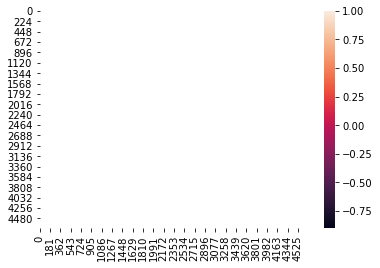

In [23]:
# npy_clustering_data = clustering_data.to_numpy(dtype = 'float64')
corr = np.corrcoef(npy_clustering_data)
print(np.amin(corr))
sns.heatmap(corr)

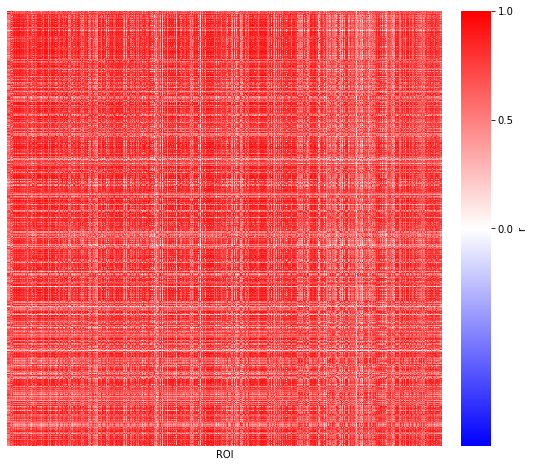

In [9]:
corr = np.corrcoef(npy_clustering_data)

fig, axes = plt.subplots(1, 2, figsize=(9, 8), gridspec_kw=dict(width_ratios=[.8, .05]))

sns.heatmap(corr, vmax=1, vmin=-1, cmap='bwr', ax=axes[0], cbar_ax=axes[1], square=True,
            cbar_kws=dict(ticks=[0, 0.5, 1], label='r'))

for ax in axes.ravel()[:-1]:
    ax.set_yticks([])
    ax.set_xticks([])

axes[0].set_xlabel('ROI')

fig.subplots_adjust(wspace=0)

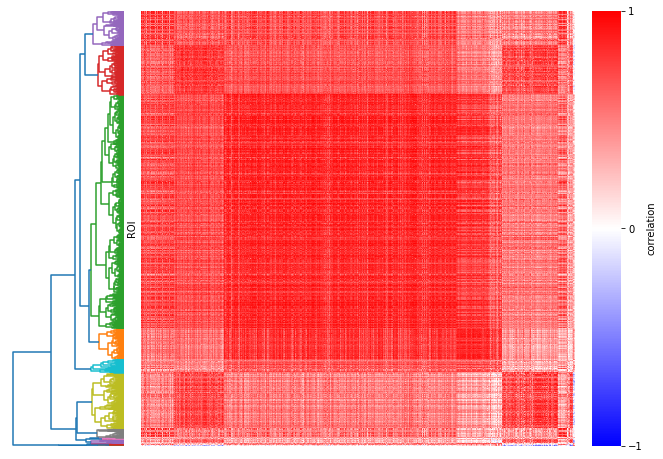

In [15]:
threshold_ratio = 0.3
d = sch.distance.pdist(corr)
L = sch.linkage(d, method='complete')
clusters = sch.fcluster(L, threshold_ratio * d.max(), 'distance')

argsort = np.argsort(clusters)[::-1]

fig, axes = plt.subplots(1, 3, figsize=(11, 8), gridspec_kw=dict(width_ratios=[.2, .8, .05]))
sch.dendrogram(L, orientation='left', ax=axes[0], color_threshold=threshold_ratio*d.max())
sns.heatmap(corr[argsort][:, argsort], vmax=1, vmin=-1, cmap='bwr', ax=axes[1], cbar_ax=axes[2],
            square=True, cbar_kws=dict(ticks=[-1,0,1], label='correlation'))

axes[0].axis('off')
axes[1].set_yticks([])
axes[1].set_xticks([])
axes[1].set_ylabel('ROI')


# fig.suptitle("Hierechical Clustering of stimulus active neurons(n=598 in 9 fish)",fontsize = 20)
fig.subplots_adjust(wspace=0)

In [16]:
cluster_idx=np.unique(clusters)
for i in cluster_idx:
    locals()['cluster_'+str(i)+'_roi_idx'] = list(np.where(clusters == i)[0])

In [17]:
def Plot_Overlaid_Activity(ROI_iloc_list):
#     locals()[Fish_Index +'Max_DeltaF'] = pandas.read_excel(Saving_Directory + Fish_Index + '_Max_DeltaF2' + '.xlsx',sheet_name='Max_F')
#     locals()[Fish_Index +'Max_DeltaF'].drop(locals()[Fish_Index +'Max_DeltaF'].columns[0], inplace=True, axis=1)

#     Stimulus_Sizes = [2,3,4,6,8,10,0]
#     selective_clustering_data
    ROI_Activity_AVG = []
    ROI_Activity_STD = []
#         ROI_Activity = pandas.DataFrame()
#         for n in ROI_list:
#             if vsinfo.Right[n] == Stimulus_Sizes[s]:
#                 Trial = pandas.read_excel(Saving_Directory + Fish_Index + '_Trial' + str(n+1) + '.xlsx')
#                 ROI_Activity = ROI_Activity.append(Trial[Trial.Label == ROI])
    total_frame_no = npy_clustering_data.shape[1]
    for frame in range(0,total_frame_no):
        ROI_Activity_AVG.append(npy_clustering_data[ROI_iloc_list, frame].mean())
        ROI_Activity_STD.append(npy_clustering_data[ROI_iloc_list, frame].std())

#     # plot
#     Onset = 39
#     move = 46
#     stop = 54

    fig, ax = plt.subplots(1, 1, figsize=(15, 3))
#     plt.title('Averged Activity of ROI ' + str(ROI) + ' to different dot sizes', fontsize=20)
#     ax.set_ylabel('DeltaF/F', fontsize=15)
#     ax.set_xlabel('Frames', fontsize=16)
    ax.set_ylabel('DeltaF/F', fontsize=16)
    plt.ylim(-0.2, 3)
    plt.xlim(0, 39*4)
    plt.axvline(39, color='grey',alpha = 0.3)
    plt.axvline(39*2, color='grey',alpha = 0.3)
    plt.axvline(39*3, color='grey',alpha = 0.3)

    
#     plt.fill_between(np.arange(27,30),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
    plt.fill_between(np.arange(27+39,30+39),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
    plt.fill_between(np.arange(27+39*2,30+39*2),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
    plt.fill_between(np.arange(27+39*3,30+39*3),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
    
#     plt.axvline(Onset, 0, 100, label='Onset', color='grey')
#     plt.axvline(move, 0, 100, label='Move', color='red')
#     plt.axvline(stop, 0, 100, label='Stop', color='grey')
#     plt.axvline(stop + 8, 0, 100, label='1s after Stop', color='orange')
#     plt.axhline(0, 0, 121, label='AVG_Baseline', color='purple')
#     ax.tick_params(axis='x', labelsize=15)
#     ax.tick_params(axis='y', labelsize=15)
#     x_ticks = numpy.arange(0, 92, 7.7)
#     plt.xticks(x_ticks)
    

    ROI_Activity_AVG = np.array(ROI_Activity_AVG)
    ROI_Activity_STD = np.array(ROI_Activity_STD)
    yhat = ROI_Activity_AVG
    y_minus = ROI_Activity_AVG - ROI_Activity_STD
    y_plus = ROI_Activity_AVG + ROI_Activity_STD
#     bp = ax.plot(yhat, color='C',  linewidth=3)
    for i in ROI_iloc_list:
        ax.plot(npy_clustering_data[i,:],color = 'silver',linewidth=0.4,alpha = 0.25)
    plt.fill_between(range(0, total_frame_no), y_minus, y_plus, alpha=0.3, facecolor='c')
    bp = ax.plot(yhat, color='c',  linewidth=3)
#     bp = ax.plot(locals()['ROI_Activity_AVG_'+ str(Stimulus_Sizes[6])], color='C', label= str(Stimulus_Sizes[6])+ ' Degree', linewidth=3)
    
#     if locals()[Fish_Index +'Max_DeltaF'][locals()[Fish_Index +'Max_DeltaF'].Label == ROI].Side_is_Left.tolist()[0] == True:
#         Side = 'Ipsilateral to Stimulus'
#     else:
#         Side = 'Contralateral to Stimulus'
    
#     plt.plot([0],[0], color='black', label = 'Side = ' + Side )
#     plt.plot([0],[0], color='black', label = 'Size_Preference = ' + str(format(locals()[Fish_Index +'Max_DeltaF'][locals()[Fish_Index +'Max_DeltaF'].Label == ROI].Size_Pref_Index.tolist()[0],'.2f')))
#     plt.legend()
#     plt.setp(ax.get_xticklabels(), visible=False)
#     plt.setp(ax.get_yticklabels(), visible=False)
    plt.xticks([19,58,97,136])
    plt.yticks(fontsize = 14)
    ax.set_xticklabels(['No stimulus','Prey stimulus','Freezing stimulus','Luminance Control'],fontsize = 16)
    ax.tick_params(axis='x', which='both', length=0)
#     ax.axis('off')
#     plt.show()
    return yhat

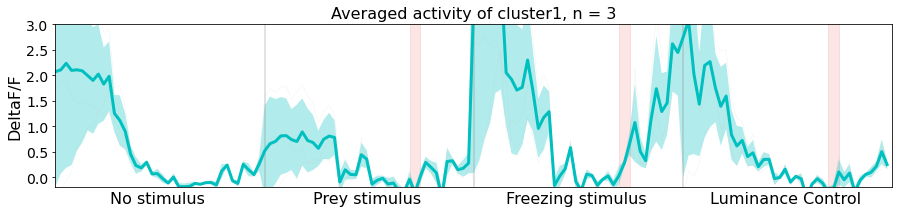

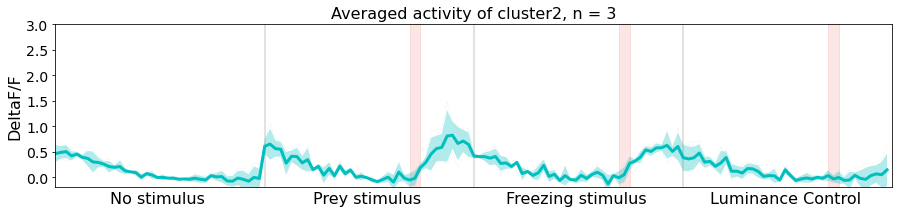

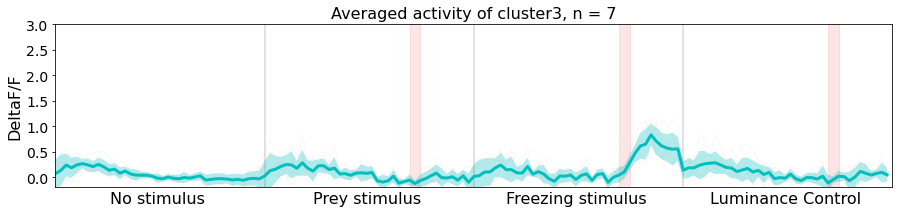

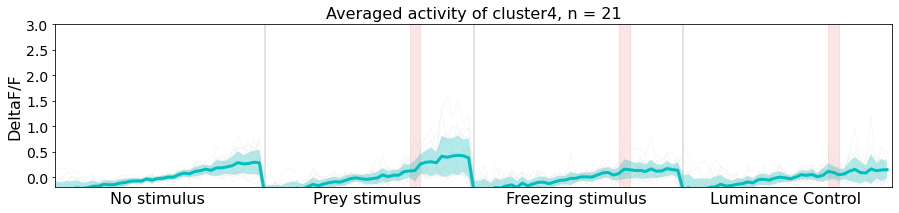

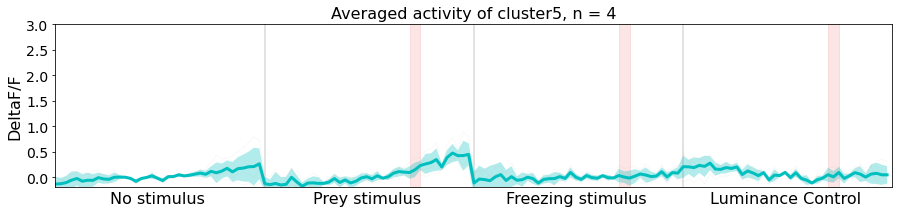

...

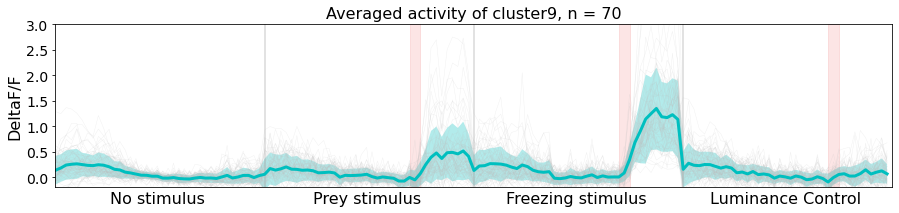

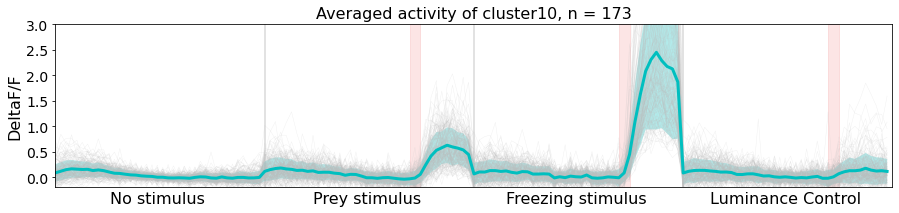

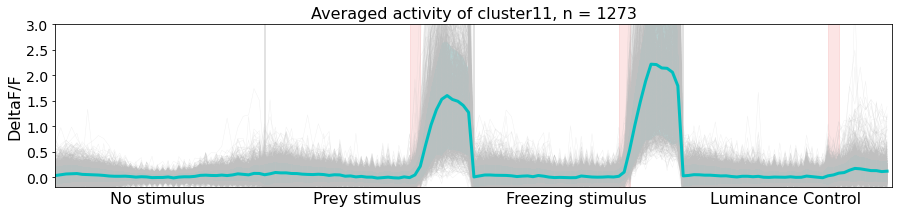

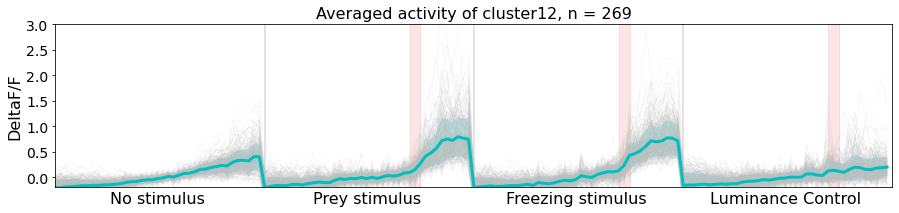

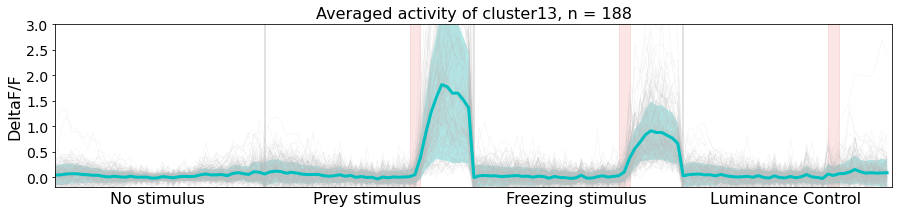

In [18]:
for i in cluster_idx:
    Plot_Overlaid_Activity(locals()['cluster_'+str(i)+'_roi_idx'])
    plt.title('Averaged activity of cluster'+str(i)+', n = '+str(len(locals()['cluster_'+str(i)+'_roi_idx'])),fontsize = 16)
    plt.show()

In [271]:
df_ROI_info_20230102

,Date,Fish,Plane,ROI_id
0,20230102,F2_16_00,1,96
1,20230102,F2_16_00,1,116
2,20230102,F2_16_00,1,189
3,20230102,F2_16_00,1,219
4,20230102,F2_16_00,1,276
...,...,...,...,...
910,20230102,F2_16_00,9,2613
911,20230102,F2_16_00,9,2677
912,20230102,F2_16_00,9,2726
913,20230102,F2_16_00,9,2756


In [276]:
df_ROI_info_all

,Date,Fish,Plane,ROI_id
0,20230102,F2_16_00,1,96
1,20230102,F2_16_00,1,116
2,20230102,F2_16_00,1,189
3,20230102,F2_16_00,1,219
4,20230102,F2_16_00,1,276
...,...,...,...,...
1106,20230103,F4_16_00,9,1975
1107,20230103,F4_16_00,9,2009
1108,20230103,F4_16_00,9,2054
1109,20230103,F4_16_00,9,2143


In [261]:
np_cluster_19_id = np.array([ 276,  558, 1211, 1660,  343,  624,  840, 1404, 1411,  238,  740,
       1138, 1301, 1407, 1976,   40,  127,  608,  819, 1321, 1545, 1784,
       1845, 2036, 2044, 2252, 2259, 2536,   97,  284, 1503, 2589])
# plane
for ROI in np_cluster_19_id:
    print(df_ROI_info_all[df_ROI_info_all.ROI_id == ROI])


       Date      Fish  Plane  ROI_id
4  20230102  F2_16_00      1     276
        Date      Fish  Plane  ROI_id
13  20230102  F2_16_00      2     558
         Date      Fish  Plane  ROI_id
85   20230102  F2_16_00      4    1211
834  20230102  F2_16_00      9    1211
         Date      Fish  Plane  ROI_id
108  20230102  F2_16_00      4    1660
         Date      Fish  Plane  ROI_id
140  20230102  F2_16_00      5     343
         Date      Fish  Plane  ROI_id
151  20230102  F2_16_00      5     624
180  20230103  F2_12_30      7     624
         Date      Fish  Plane  ROI_id
164  20230102  F2_16_00      5     840
807  20230102  F2_16_00      9     840
         Date      Fish  Plane  ROI_id
199  20230102  F2_16_00      5    1404
         Date      Fish  Plane  ROI_id
200  20230102  F2_16_00      5    1411
521  20230102  F2_16_00      7    1411
         Date      Fish  Plane  ROI_id
283  20230102  F2_16_00      6     238
         Date      Fish  Plane  ROI_id
308  20230102  F2_16_00      6 

-0.7964664336891768


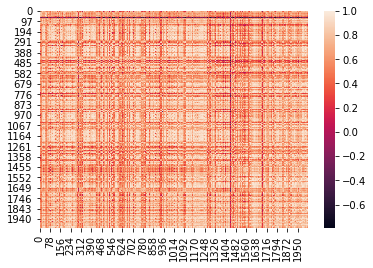

In [301]:
npy_clustering_data = clustering_data_all.to_numpy(dtype = 'float64')
corr = np.corrcoef(npy_clustering_data)
print(np.amin(corr))
sns.heatmap(corr)

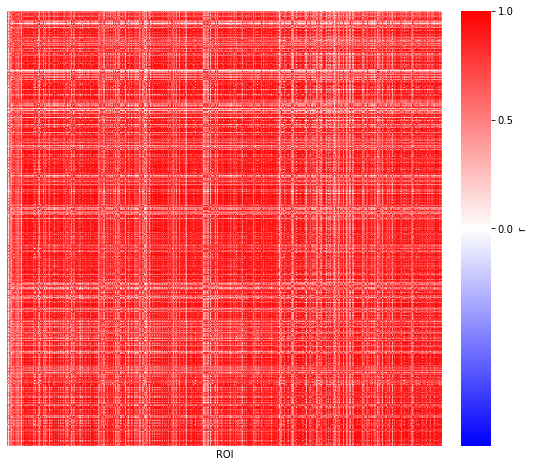

In [302]:
corr = np.corrcoef(npy_clustering_data)

fig, axes = plt.subplots(1, 2, figsize=(9, 8), gridspec_kw=dict(width_ratios=[.8, .05]))

sns.heatmap(corr, vmax=1, vmin=-1, cmap='bwr', ax=axes[0], cbar_ax=axes[1], square=True,
            cbar_kws=dict(ticks=[0, 0.5, 1], label='r'))

for ax in axes.ravel()[:-1]:
    ax.set_yticks([])
    ax.set_xticks([])

axes[0].set_xlabel('ROI')

fig.subplots_adjust(wspace=0)

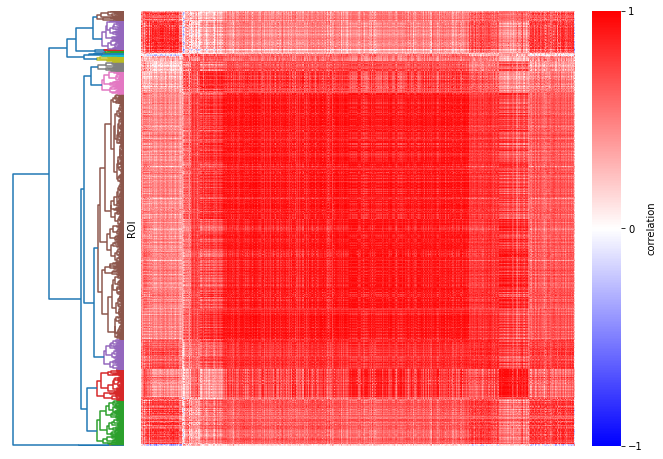

In [303]:
threshold_ratio = 0.25
d = sch.distance.pdist(corr)
L = sch.linkage(d, method='complete')
clusters = sch.fcluster(L, threshold_ratio * d.max(), 'distance')

argsort = np.argsort(clusters)[::-1]

fig, axes = plt.subplots(1, 3, figsize=(11, 8), gridspec_kw=dict(width_ratios=[.2, .8, .05]))
sch.dendrogram(L, orientation='left', ax=axes[0], color_threshold=threshold_ratio*d.max())
sns.heatmap(corr[argsort][:, argsort], vmax=1, vmin=-1, cmap='bwr', ax=axes[1], cbar_ax=axes[2],
            square=True, cbar_kws=dict(ticks=[-1,0,1], label='correlation'))

axes[0].axis('off')
axes[1].set_yticks([])
axes[1].set_xticks([])
axes[1].set_ylabel('ROI')


# fig.suptitle("Hierechical Clustering of stimulus active neurons(n=598 in 9 fish)",fontsize = 20)
fig.subplots_adjust(wspace=0)

In [304]:
cluster_idx=np.unique(clusters)
for i in cluster_idx:
    locals()['cluster_'+str(i)+'_roi_idx'] = list(np.where(clusters == i)[0])

In [305]:
def Plot_Overlaid_Activity(ROI_iloc_list):
#     locals()[Fish_Index +'Max_DeltaF'] = pandas.read_excel(Saving_Directory + Fish_Index + '_Max_DeltaF2' + '.xlsx',sheet_name='Max_F')
#     locals()[Fish_Index +'Max_DeltaF'].drop(locals()[Fish_Index +'Max_DeltaF'].columns[0], inplace=True, axis=1)

#     Stimulus_Sizes = [2,3,4,6,8,10,0]
#     selective_clustering_data
    ROI_Activity_AVG = []
    ROI_Activity_STD = []
#         ROI_Activity = pandas.DataFrame()
#         for n in ROI_list:
#             if vsinfo.Right[n] == Stimulus_Sizes[s]:
#                 Trial = pandas.read_excel(Saving_Directory + Fish_Index + '_Trial' + str(n+1) + '.xlsx')
#                 ROI_Activity = ROI_Activity.append(Trial[Trial.Label == ROI])
    total_frame_no = npy_clustering_data.shape[1]
    for frame in range(0,total_frame_no):
        ROI_Activity_AVG.append(npy_clustering_data[ROI_iloc_list, frame].mean())
        ROI_Activity_STD.append(npy_clustering_data[ROI_iloc_list, frame].std())

#     # plot
#     Onset = 39
#     move = 46
#     stop = 54

    fig, ax = plt.subplots(1, 1, figsize=(15, 3))
#     plt.title('Averged Activity of ROI ' + str(ROI) + ' to different dot sizes', fontsize=20)
#     ax.set_ylabel('DeltaF/F', fontsize=15)
#     ax.set_xlabel('Frames', fontsize=16)
    ax.set_ylabel('DeltaF/F', fontsize=16)
    plt.ylim(-0.2, 3)
    plt.xlim(0, 39*4)
    plt.axvline(39, color='grey',alpha = 0.3)
    plt.axvline(39*2, color='grey',alpha = 0.3)
    plt.axvline(39*3, color='grey',alpha = 0.3)

    
#     plt.fill_between(np.arange(27,30),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
    plt.fill_between(np.arange(27+39,30+39),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
    plt.fill_between(np.arange(27+39*2,30+39*2),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
    plt.fill_between(np.arange(27+39*3,30+39*3),3,-0.2,linewidth = 1,color = 'lightcoral',alpha = 0.2)
    
#     plt.axvline(Onset, 0, 100, label='Onset', color='grey')
#     plt.axvline(move, 0, 100, label='Move', color='red')
#     plt.axvline(stop, 0, 100, label='Stop', color='grey')
#     plt.axvline(stop + 8, 0, 100, label='1s after Stop', color='orange')
#     plt.axhline(0, 0, 121, label='AVG_Baseline', color='purple')
#     ax.tick_params(axis='x', labelsize=15)
#     ax.tick_params(axis='y', labelsize=15)
#     x_ticks = numpy.arange(0, 92, 7.7)
#     plt.xticks(x_ticks)
    

    ROI_Activity_AVG = np.array(ROI_Activity_AVG)
    ROI_Activity_STD = np.array(ROI_Activity_STD)
    yhat = ROI_Activity_AVG
    y_minus = ROI_Activity_AVG - ROI_Activity_STD
    y_plus = ROI_Activity_AVG + ROI_Activity_STD
#     bp = ax.plot(yhat, color='C',  linewidth=3)
    for i in ROI_iloc_list:
        ax.plot(npy_clustering_data[i,:],color = 'silver',linewidth=0.4,alpha = 0.25)
    plt.fill_between(range(0, total_frame_no), y_minus, y_plus, alpha=0.3, facecolor='c')
    bp = ax.plot(yhat, color='c',  linewidth=3)
#     bp = ax.plot(locals()['ROI_Activity_AVG_'+ str(Stimulus_Sizes[6])], color='C', label= str(Stimulus_Sizes[6])+ ' Degree', linewidth=3)
    
#     if locals()[Fish_Index +'Max_DeltaF'][locals()[Fish_Index +'Max_DeltaF'].Label == ROI].Side_is_Left.tolist()[0] == True:
#         Side = 'Ipsilateral to Stimulus'
#     else:
#         Side = 'Contralateral to Stimulus'
    
#     plt.plot([0],[0], color='black', label = 'Side = ' + Side )
#     plt.plot([0],[0], color='black', label = 'Size_Preference = ' + str(format(locals()[Fish_Index +'Max_DeltaF'][locals()[Fish_Index +'Max_DeltaF'].Label == ROI].Size_Pref_Index.tolist()[0],'.2f')))
#     plt.legend()
#     plt.setp(ax.get_xticklabels(), visible=False)
#     plt.setp(ax.get_yticklabels(), visible=False)
    plt.xticks([19,58,97,136])
    plt.yticks(fontsize = 14)
    ax.set_xticklabels(['No stimulus','Prey stimulus','Freezing stimulus','Luminance Control'],fontsize = 16)
    ax.tick_params(axis='x', which='both', length=0)
#     ax.axis('off')
#     plt.show()
    return yhat

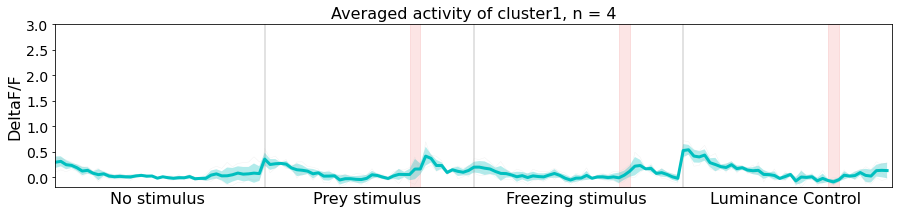

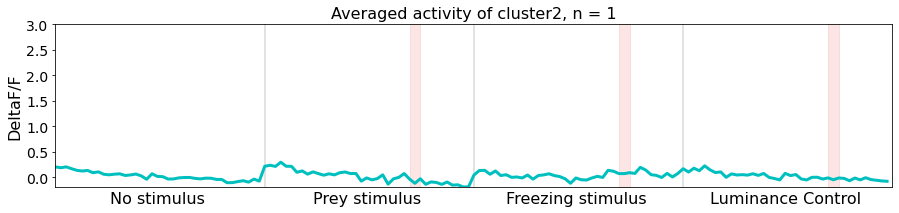

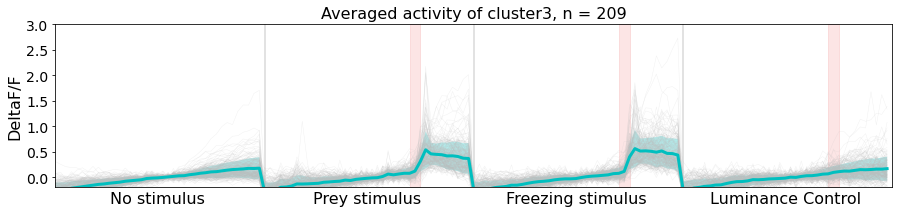

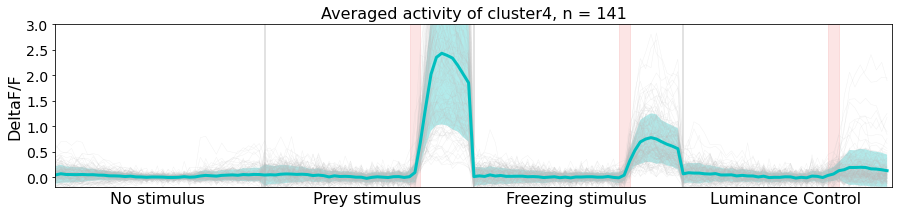

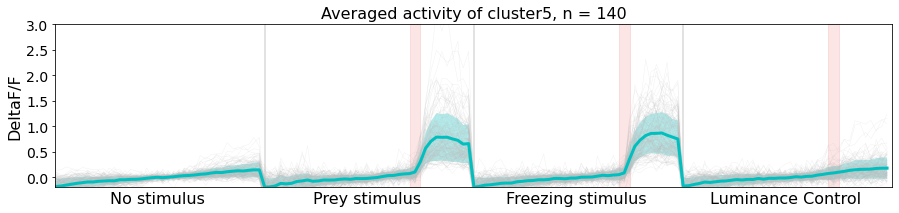

...

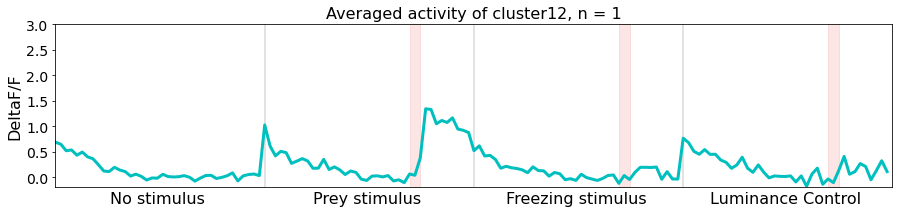

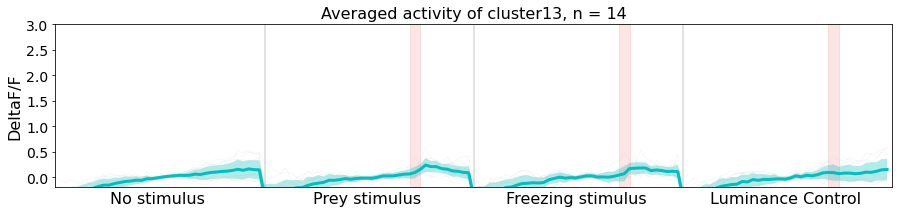

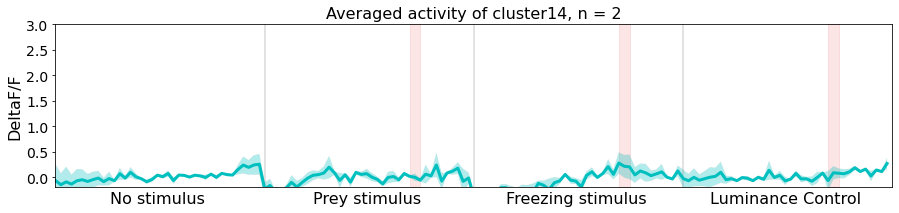

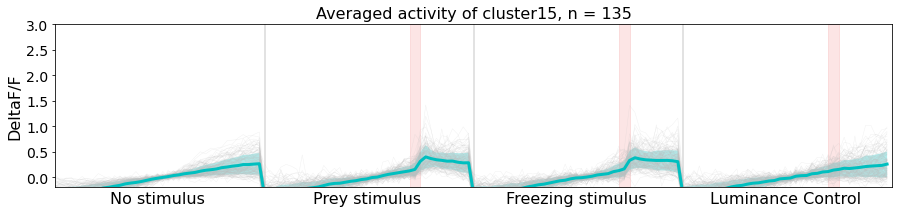

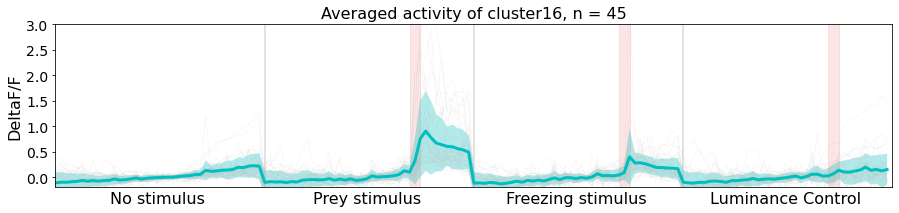

In [306]:
for i in cluster_idx:
    Plot_Overlaid_Activity(locals()['cluster_'+str(i)+'_roi_idx'])
    plt.title('Averaged activity of cluster'+str(i)+', n = '+str(len(locals()['cluster_'+str(i)+'_roi_idx'])),fontsize = 16)
    plt.show()

In [325]:
for i in idx_freezing_cluster:
    print(clusters[i])

9
7
7
7
7
9
7
9
7
7
7
9
7
7
7
9
7
9
9
7
7
7
7
7
7
7
9
9
7
3
7
7


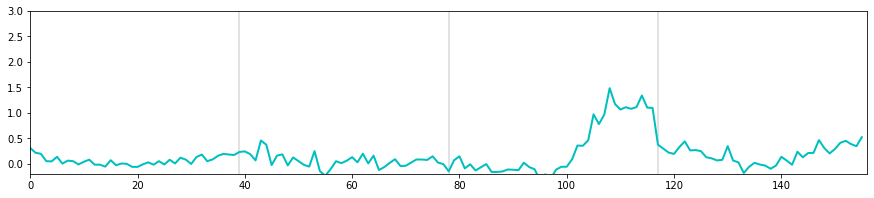

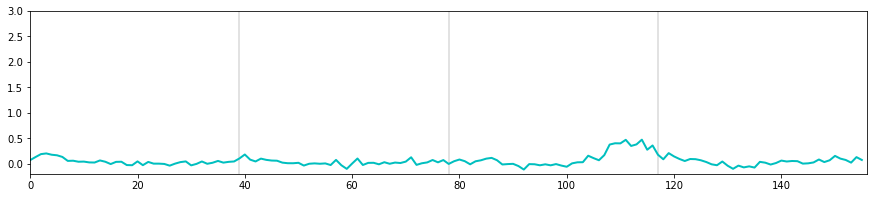

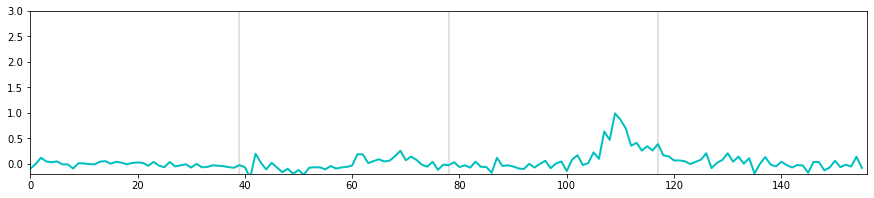

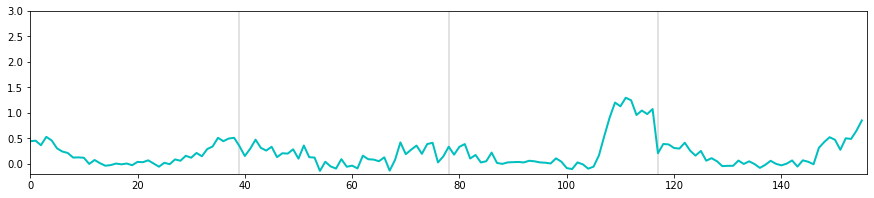

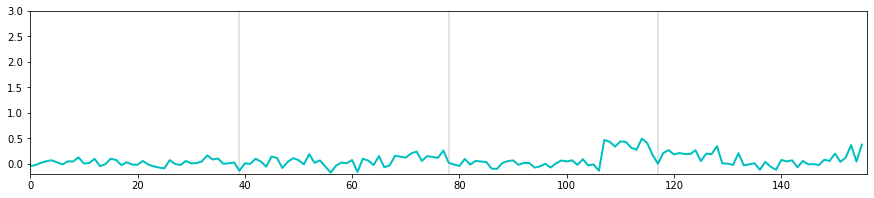

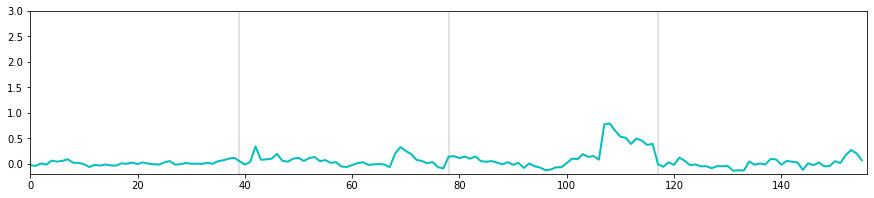

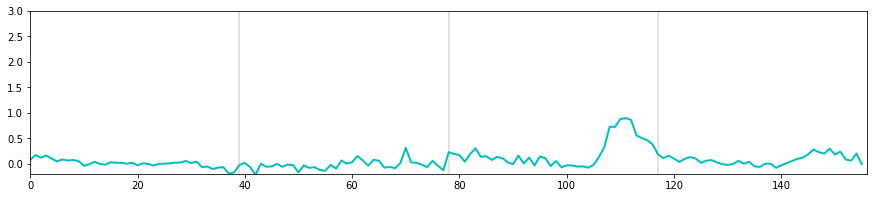

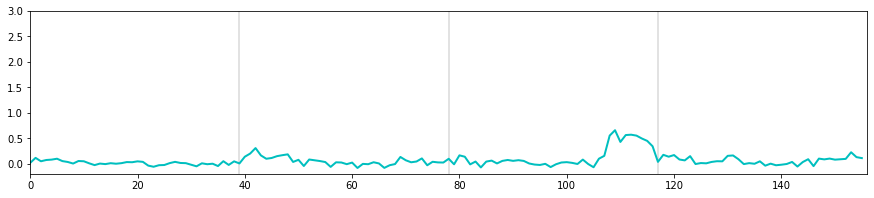

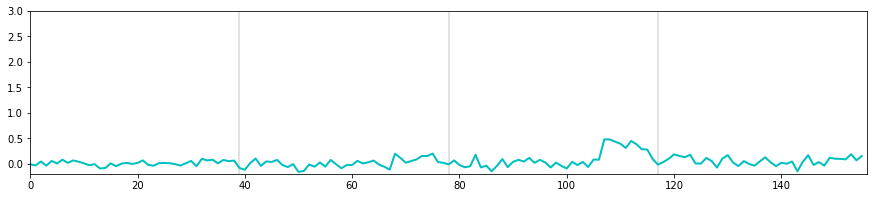

In [328]:
for i in idx_freezing_cluster:
#     if clusters[i] == 6 or clusters[i] == 8:
    if clusters[i] == 9:
        fig, ax = plt.subplots(1, 1, figsize=(15, 3))
        plt.ylim(-0.2, 3)
        plt.xlim(0, 39*4)
        plt.axvline(39, color='grey',alpha = 0.3)
        plt.axvline(39*2, color='grey',alpha = 0.3)
        plt.axvline(39*3, color='grey',alpha = 0.3)
        ax.plot(range(0,39*4),npy_clustering_data[i,:],color = 'C',linewidth=2)

In [315]:
cluster_9_roi_idx

[4,
 22,
 33,
 48,
 49,
 131,
 132,
 151,
 199,
 204,
 295,
 330,
 427,
 430,
 459,
 476,
 578,
 588,
 650,
 776,
 810,
 837,
 946,
 1022,
 1267,
 1837,
 1892]

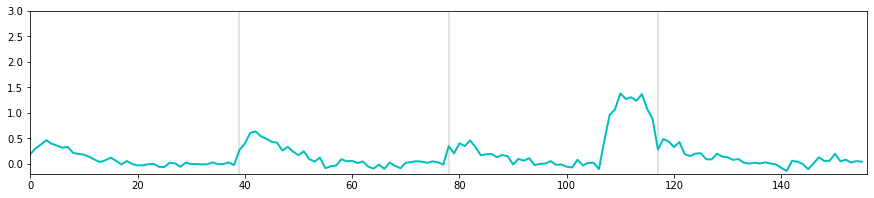

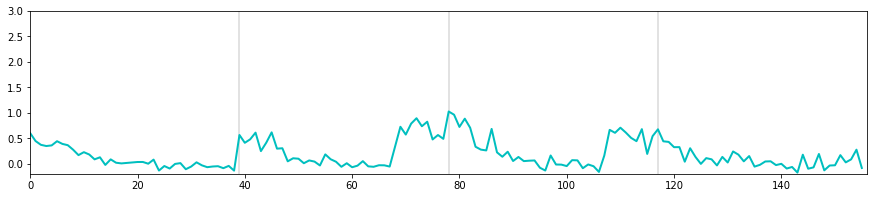

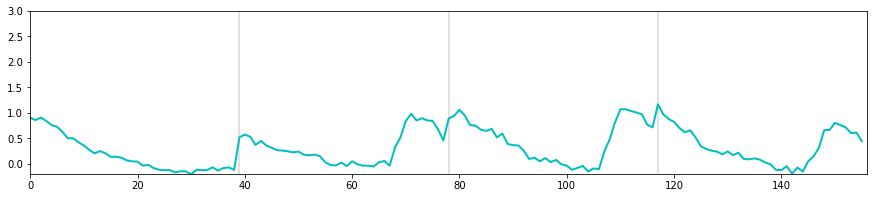

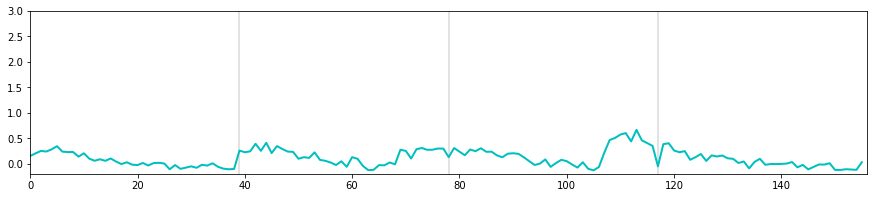

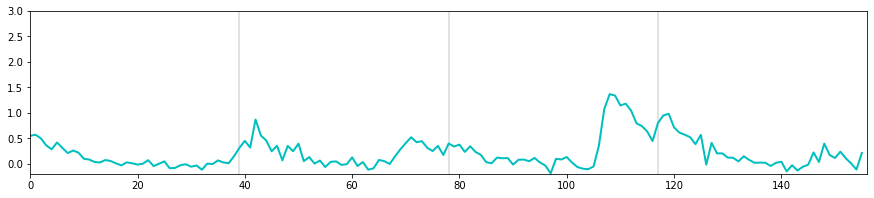

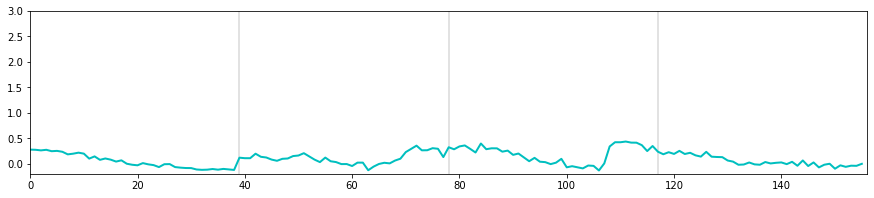

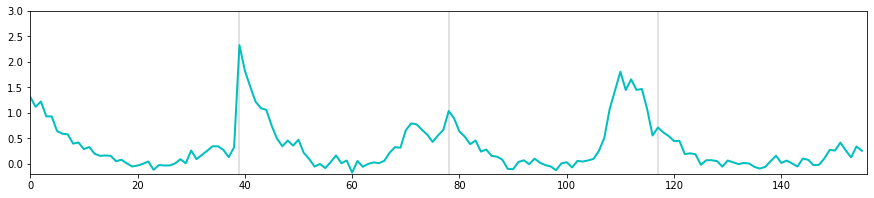

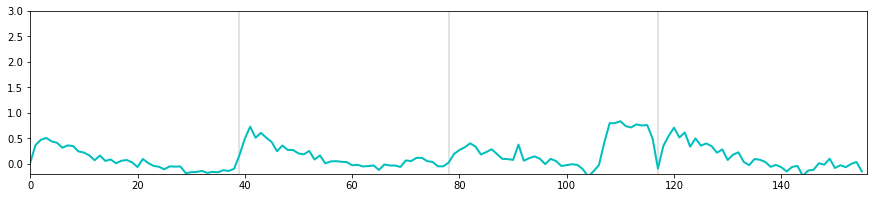

In [333]:
for i in range(0,len(cluster_10_roi_idx)):
    fig, ax = plt.subplots(1, 1, figsize=(15, 3))
    plt.ylim(-0.2, 3)
    plt.xlim(0, 39*4)
    plt.axvline(39, color='grey',alpha = 0.3)
    plt.axvline(39*2, color='grey',alpha = 0.3)
    plt.axvline(39*3, color='grey',alpha = 0.3)
    ax.plot(range(0,39*4),npy_clustering_data[cluster_10_roi_idx[i],:],color = 'C',linewidth=2)
#     total_frame_no = npy_3_selective_double_data.shape[1]
#     ax.plot(range(92, total_frame_no+92),npy_3_selective_double_data[cluster_3_roi_idx[i],:],color = 'r',linewidth=2)
#     ax.plot(range(92, total_frame_no+92),npy_6_selective_double_data[cluster_3_roi_idx[i],:],color = 'y',linewidth=2)
#     ax.plot(range(92, total_frame_no+92),npy_10_selective_double_data[cluster_3_roi_idx[i],:],color = 'b',linewidth=2)

#     # ax.axis('off')
    plt.show()

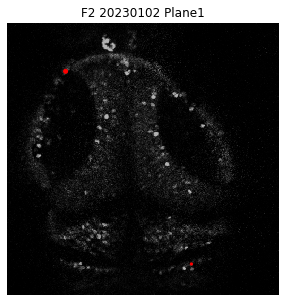

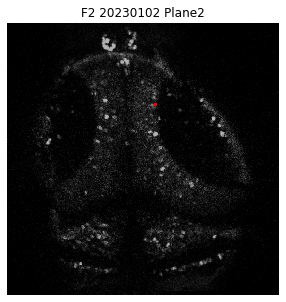

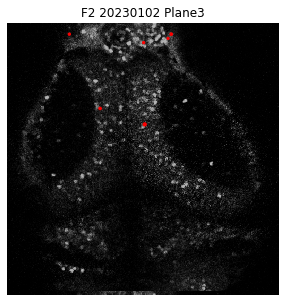

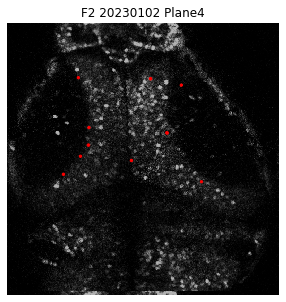

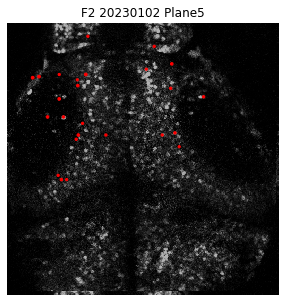

...

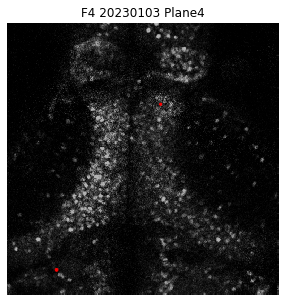

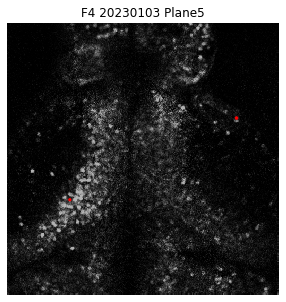

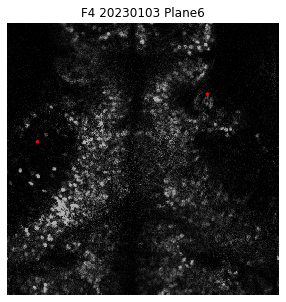

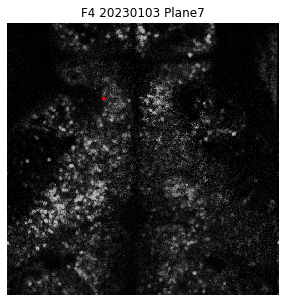

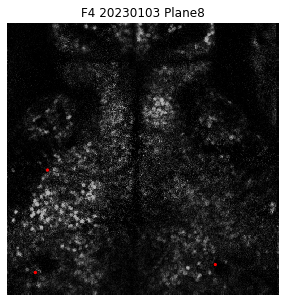

In [380]:
main_dir = 'D:\\LCr_UV_HSA_Luminance_4\\'
cluster_idx = cluster_7_roi_idx+cluster_9_roi_idx+cluster_10_roi_idx

temp_df_ROI_info = df_ROI_info_all.iloc[cluster_idx,:]
for date_no in np.unique(temp_df_ROI_info.Date):
    temp_df_ROI_info_date = temp_df_ROI_info[temp_df_ROI_info.Date==date_no]
    for fish in np.unique(temp_df_ROI_info_date.Fish):
        temp_df_ROI_info_fish = temp_df_ROI_info_date[temp_df_ROI_info_date.Fish==fish]
        for plane in np.unique(temp_df_ROI_info_fish.Plane):
            temp_df_ROI_info_plane = temp_df_ROI_info_fish[temp_df_ROI_info_fish.Plane==plane]
            df_cell_info = pd.read_csv(main_dir+date_no+'\\processed\\'+fish+'\\processed_suite2p\\plane'+str(plane)+'\\DeltaF_F\\cell_info_'+fish+'.csv')
            
            temp_cell_idx_list = []
            for ROI_id in temp_df_ROI_info_plane.ROI_id:
                temp_cell_idx_list.append(np.where(df_cell_info.ROI_id == ROI_id)[0][0])
                
            x_coor = np.array(df_cell_info.centroid_x[temp_cell_idx_list])
            y_coor = np.array(df_cell_info.centroid_y[temp_cell_idx_list])
            radius_list = np.array(df_cell_info.radius[temp_cell_idx_list])
            
            
            file = main_dir+date_no+'\\processed\\'+fish+'\\processed_suite2p\\plane'+str(plane)+'\\plane0\\reg_tif\\file000_chan0.tif'
            temp_tif = tifffile.imread(file)
#             temp_average_tif = np.average(temp_tif,axis = (1,2))
        #     print(temp_average_tif.shape)
#             temp_frame = np.argmax(temp_average_tif)
            plt.figure(figsize = (5,5))
            ax_baseline = sns.heatmap(temp_tif, cmap='gray', vmin=0, vmax=255,square = True,cbar = False)
            ax_baseline.scatter(x_coor,y_coor,radius_list*1.5,c = 'r')
            ax_baseline.tick_params(left=False, bottom=False)
            ax_baseline.axis('off')
            plt.title(fish[:2]+' '+date_no+' Plane'+str(plane))
            plt.show()

(512, 512)

In [354]:
temp_df_ROI_info_plane

,Date,Fish,Plane,ROI_id
970,20230103,F4_16_00,8,96
974,20230103,F4_16_00,8,223


In [370]:
df_cell_info.iloc[temp_cell_idx_list,:]
np.array(df_cell_info.centroid_x[temp_cell_idx_list])

array([392,  53], dtype=int64)

In [371]:
df_cell_info

,ROI_id,centroid_x,centroid_y,npix,radius
0,0,60,263,62,3.946985
1,1,65,386,43,3.542193
2,2,142,373,98,5.323829
3,3,262,171,89,5.383691
4,4,58,343,44,3.453176
...,...,...,...,...,...
2084,2959,430,87,54,4.417020
2085,2961,288,325,43,3.472793
2086,2964,470,257,68,3.342141
2087,2969,72,179,49,5.747509


In [340]:
cluster_7_roi_idx

[0,
 13,
 23,
 31,
 55,
 69,
 74,
 85,
 93,
 95,
 108,
 117,
 118,
 124,
 134,
 135,
 140,
 160,
 164,
 174,
 176,
 192,
 200,
 205,
 207,
 238,
 241,
 250,
 251,
 257,
 264,
 273,
 283,
 286,
 288,
 308,
 310,
 343,
 347,
 352,
 388,
 402,
 419,
 424,
 426,
 435,
 470,
 473,
 475,
 512,
 527,
 529,
 545,
 546,
 549,
 565,
 566,
 567,
 575,
 581,
 595,
 603,
 605,
 621,
 623,
 655,
 688,
 704,
 708,
 710,
 737,
 792,
 838,
 852,
 909,
 911,
 953,
 967,
 971,
 976,
 985,
 994,
 1000,
 1008,
 1042,
 1065,
 1075,
 1093,
 1109,
 1233,
 1253,
 1315,
 1360,
 1408,
 1421,
 1505,
 1535,
 1565,
 1690,
 1710,
 1733,
 1742,
 1785,
 1804,
 1885,
 1889]

In [63]:
range(0,len(fish_index_list))

range(0, 1)

In [51]:
locals()['df_'+date_no+'_'+fish_index_list[i]+'_p'+str(plane_i)+'_trial_'+str(t)]

KeyError: 'df_20230102_F2_16_00_p1_trial_47'

In [25]:
main_dir = "D:\\LCr_UV_HSA_Luminance_4\\20230102"
date_no = main_dir.split('\\')[-1]
fish_index_list =['F2_16_00']

# stim_list = [0,2,3,4,6,8,10]
time_len = 39
plane_no = 9
i = 0
vsinfo = pd.read_excel(main_dir+'\\behavior\\'+fish_index_list[i]+'//vsinfo_'+date_no+'_'+fish_index_list[i]+'.xlsx')
trial_no = vsinfo.shape[0]
